<a href="https://www.kaggle.com/code/kalilurrahman/2022-kaggle-mlds-survey-a-correlation-analysis?scriptVersionId=108544406" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
!pip install rich
from rich import print
from rich.console import Console
from rich.table import Table
from rich.progress import track
from time import sleep
import os
import sys
from rich.columns import Columns
from rich.markdown import Markdown
from rich.syntax import Syntax

# <strong>2022 Kaggle Data Science Analysis and Survey</strong>

Let us see the analysis of the responses - shall we?
<hr>



In [2]:
from IPython.core.display import display, HTML

display(HTML('<h2> Total Responses == 23997'))
print("Total Responses, [bold red]23,997[/bold red]! :thumbs_up: :green_heart: :man:")
print(":keycap_1: Total Number of Respondents using [italic red]15 or more Minutes[/italic red]: [italic bold green]4374 :smiley:[/italic bold green]!")
print(":keycap_2: Total Number of Respondents using [italic blue]10 or more Minutes[/italic blue]: [italic bold green]7632 :smiley:[/italic bold green]!")
print(":keycap_3: Total Number of Respondents using [italic green]5 or more Minutes[/italic green]: [italic bold blue]16362 :smiley:[/italic bold blue]!")
print(":keycap_4: [italic black]Everyone took more than a minute :watch: to Respond[/italic black]!")
print(":keycap_5: [bold italic black]Most of the respondents took between 3-  :watch: :watch: :watch: minutes range[/bold italic black]!")
print(":keycap_6: [bold italic red]Most of the respondents were between 18-29 years old[/bold italic red]!")
print(":keycap_7: [bold italic violet]Most of the respondents earning less than $10K followed by $10-50K[/bold italic violet]. [hr] Most of them are either students or early career professionals.Many participants are from India!")
print(":keycap_8: [bold italic red]Most of the respondents have less than 1 year machine learning experience[/bold italic red]!")
print(":keycap_9: [bold italic red]Most of the respondents have less than 1-3 years of programming experience[/bold italic red]!")

display(HTML('</h2>'))

display(HTML('<h1><br><em>Country Responses</em></h1><ul dir="auto"><li><em>(India )</em> led the responses with <strong>2328</strong> in total</li><li><em>(USA)</em> followed India with a total of <strong>1434</strong> responses</li><li><em>(Japan, Brazil and Nigeria)</em>  made up the <strong>top-5</strong> responding countries in the survey</li></ul></li>'))


Total Responses, 23,997! 👍 💚 👨

1️⃣ Total Number of Respondents using 15 or more Minutes: 4374 😃!

2️⃣ Total Number of Respondents using 10 or more Minutes: 7632 😃!

3️⃣ Total Number of Respondents using 5 or more Minutes: 16362 😃!

4️⃣ Everyone took more than a minute ⌚ to Respond!

5️⃣ Most of the respondents took between 3-  ⌚ ⌚ ⌚ minutes range!

6️⃣ Most of the respondents were between 18-29 years old!

7️⃣ Most of the respondents earning less than $10K followed by $10-50K.  Most of them are 
either students or early career professionals.Many participants are from India!

8️⃣ Most of the respondents have less than 1 year machine learning experience!

9️⃣ Most of the respondents have less than 1-3 years of programming experience!




<hr>
I hope you like it and learn and benefit from this!

In [3]:
# Import Python packages
import numpy as np 
import pandas as pd 
import os
import math
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.core import display as ICD
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.api.types import CategoricalDtype
import matplotlib.gridspec as gridspec
try:
    import plotly.express as px
except:
    !pip install plotly-express
    import plotly.express as px

init_notebook_mode(connected=True)
pd.set_option('display.max_columns', 5000)
base_dir = '../input/'
fileName = 'kaggle-survey-2022/kaggle_survey_2022_responses.csv'
filePath = os.path.join(base_dir,fileName)
kaggle_2022 = pd.read_csv(filePath,skiprows = 1) 

## <strong>Simple Summary of the dataset</strong>

In [4]:
print(f'Number of rows: {kaggle_2022.shape[0]}; Number of columns: {kaggle_2022.shape[1]}; No of missing values: {sum(kaggle_2022.isna().sum())}')


Number of rows: 23997; Number of columns: 296; No of missing values: 6244683

## <strong>Define the columns </strong>

In [5]:
col_dict = {0: 'Duration',

 1: 'Age Group',

 2: 'Gender',

 3: 'Country',

 4: 'Education Level',

 5: 'Coursera',
 6: 'edX',
 7: 'Kaggle Learn Courses',
 8: 'DataCamp',
 9: 'Fast.ai Learning',
 10: 'Udacity',
 11: 'Udemy',
 12: 'LinkedIn Learning',
 13: 'Cloud-certification programs (direct from AWS, Azure, GCP, or similar)',
 14: 'University Courses (resulting in a university degree)',
 15: 'Learn ML None',
 16: 'Learn ML Other',

 17: 'University Courses',
 18: 'Online courses (Coursera, EdX, etc)',
 19: 'Social media platforms (Reddit, Twitter, etc) ',
 20: 'Video platforms (YouTube, Twitch, etc) ',
 21: 'Kaggle (notebooks, competitions, etc) ',
 22: 'First Platform - None / I do not study data science',
 23: 'First Platform - Other',

 24: 'Highest level of Education',

 25: 'Published Research',
 26: 'Theoretical research)',
 27: 'Applied Research',
 28: 'No Research',

 29: 'Programming Experience',

 30: 'Python',
 31: 'R',
 32: 'SQL',
 33: 'C',
 34: 'C#',
 35: 'C++',
 36: 'Java',
 37: 'Javascript',
 38: 'Bash',
 39: 'PHP',
 40: 'MATLAB',
 41: 'Julia',
 42: 'Go',
 43: 'Programming None',
 44: 'Programming Other',

 45: 'JupyterLab',
 46: 'RStudio',
 47: 'Visual Studio',
 48: 'Visual Studio Code',
 49: 'PyCharm',
 50: 'Spyder',
 51: 'Notepad++',
 52: 'Sublime Text',
 53: 'Vim / Emacs',
 54: 'MATLAB',
 55: 'Jupyter Notebook',
 56: 'IntelliJ',
 57: 'IDE None',
 58: 'IDE Other',

 59: 'Kaggle Notebooks',
 60: 'Colab Notebooks',
 61: 'Azure Notebooks',
 62: 'Code Ocean',
 63: 'IBM Watson Studio',
 64: 'Amazon Sagemaker Studio',
 65: 'Amazon Sagemaker Studio Lab',
 66: 'Amazon EMR Notebooks',
 67: 'Google Cloud Vertex AI Workbench ',
 68: 'Hex Workspaces',
 69: 'Noteable Notebooks',
 70: 'Databricks Collaborative Notebooks',
 71: 'Deepnote Notebooks',
 72: 'Gradient Notebooks',
 73: 'Hosted Notebooks None',
 74: 'Hosted Notebook Other',

 75: 'Matplotlib',
 76: 'Seaborn',
 77: 'Plotly / Plotly Express',
 78: 'Ggplot / ggplot2',
 79: 'Shiny',
 80: 'D3 js',
 81: 'Altair',
 82: 'Bokeh',
 83: 'Geoplotlib',
 84: 'Leaflet / Folium',
 85: 'PyGal',
 86: 'Dygraphs',
 87: 'Highcharter',
 88: 'Visualization None',
 89: 'Visualization Other',

 90: 'ML Experience',

 91: 'Scikit-learn',
 92: 'TensorFlow',
 93: 'Keras',
 94: 'PyTorch',
 95: 'Fast.ai',
 96: 'Xgboost',
 97: 'LightGBM',
 98: 'CatBoost',
 99: 'Caret',
 100: 'Tidymodels',
 101: 'JAX',
 102: 'PyTorch Lightning',
 103: 'Huggingface',
 104: 'ML None',
 105: 'ML Other',

 106: 'Linear or Logistic Regression',
 107: 'Decision Trees or Random Forests',
 108: 'Gradient Boosting Machines (xgboost, lightgbm, etc)',
 109: 'Bayesian Approaches',
 110: 'Evolutionary Approaches',
 111: 'Dense Neural Networks (MLPs, etc)',
 112: 'Convolutional Neural Networks',
 113: 'Generative Adversarial Networks',
 114: 'Recurrent Neural Networks',
 115: 'Transformer Networks (BERT, gpt-3, etc)',
 116: 'Autoencoder Networks (DAE, VAE, etc)',
 117: 'Graph Neural Networks',
 118: 'ML Algorithms None',
 119: 'ML Algorithms Other',

 120: 'General purpose image/video tools (PIL, cv2, skimage, etc)',
 121: 'Image segmentation methods (U-Net, Mask R-CNN, etc)',
 122: 'Object detection methods (YOLOv6, RetinaNet, etc)',
 123: 'Image classification and other general purpose networks (VGG, Inception, ResNet, ResNeXt, NASNet, EfficientNet, etc)',
 124: 'Generative Networks (GAN, VAE, etc)',
 125: 'Vision transformer networks (ViT, DeiT, BiT, BEiT, Swin, etc)',
 126: 'CV None',
 127: 'CV Other',

 128: 'Word embeddings/vectors (GLoVe, fastText, word2vec)',
 129: 'Encoder-decorder models (seq2seq, vanilla transformers)',
 130: 'Contextualized embeddings (ELMo, CoVe)',
 131: 'Transformer language models (GPT-3, BERT, XLnet, etc)',
 132: 'NLP None',
 133: 'NLP Other',

 134: 'TensorFlow Hub',
 135: 'PyTorch Hub',
 136: 'HuggingFace Models',
 137: 'Timm',
 138: 'Jumpstart',
 139: 'ONNX models',
 140: 'NVIDIA NGC models',
 141: 'Kaggle Datasets',
 142: 'Pre-trained Models - None',
 143: 'Pre-trained Models - Others',
 144: 'Model Hub Repository',

 145: 'Current Title',

 146: 'Industry',

 147: 'Company Size',

 148: 'DS Team Size',

 149: 'ML Application in Company',

 150: 'Analyze and understand data to influence product or business decisions',
 151: 'Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data',
 152: 'Build prototypes to explore applying machine learning to new areas',
 153: 'Build and/or run a machine learning service that operationally improves my product or workflows',
 154: 'Experimentation and iteration to improve existing ML models',
 155: 'Do research that advances the state of the art of machine learning',
 156: 'None of these activities are an important part of my role at work',
 157: 'Work Activity Other',

 158: 'Annual Compensation',
 159: 'ML Spend',

 160: 'Amazon Web Services (AWS)',
 161: 'Microsoft Azure',
 162: 'Google Cloud Platform (GCP)',
 163: 'IBM Cloud / Red Hat',
 164: 'Oracle Cloud',
 165: 'SAP Cloud',
 166: 'VMware Cloud',
 167: 'Alibaba Cloud',
 168: 'Tencent Cloud',
 169: 'Huwawei Cloud',
 170: 'Cloud None',
 171: 'Cloud Other',

 172: 'Most Preferred Cloud Platform',
 173: 'VM – Amazon EC2',
 174: 'VM – MS Azure VM',
 175: 'VM – GCP Compute Engine',
 176: 'VM – Other',
 177: 'VM – None',

 178: 'Azure BLOB',
 179: 'Azure Files',
 180: 'Amazon S3',
 181: 'Amazon EFS',
 182: 'GCS',
 183: 'Google Cloud Filestore',
 184: 'Data Storage – Other',
 185: 'Data Storage – None',

 186: 'MySQL',
 187: 'PostgresSQL',
 188: 'SQLite',
 189: 'Oracle Database',
 190: 'MongoDB',
 191: 'Snowflake',
 192: 'IBM Db2',
 193: 'Microsoft SQL Server',
 194: 'Microsoft Azure SQL Database',
 195: 'Amazon Redshift',
 196: 'Amazon Athena',
 197: 'Amazon DynamoDB',
 198: 'Google Cloud BigQuery',
 199: 'Google Cloud SQL',
 200: 'DW None',
 201: 'DW Other',

 202: 'Amazon QuickSight',
 203: 'Microsoft Power BI',
 204: 'Google Data Studio',
 205: 'Looker',
 206: 'Tableau',
 207: 'Qlik Sense',
 208: 'Domo',
 209: 'TIBCO Spotfire',
 210: 'Alteryx',
 211: 'Sisense',
 212: 'SAP Analytics Cloud',
 213: 'Microsoft Azure Synapse',
 214: 'Thoughtspot',
 215: 'Data Product -  None',
 216: 'Data Product -  Other',

 217: 'Amazon SageMaker',
 218: 'Azure Machine Learning Studio',
 219: 'Google Cloud Vertex AI',
 220: 'DataRobot',
 221: 'DataBricks',
 222: 'Dataiku',
 223: 'Alteryx',
 224: 'Rapidminer',
 225: 'C3.ai',
 226: 'Domino Data lab',
 227: 'H2O AI Cloud',
 228: 'Managed Machine Learning -  None',
 229: 'Managed Machine Learning -  Other',

 230: 'Google Cloud AutoML',
 231: 'H2O Driverless AI',
 232: 'Databricks AutoML',
 233: 'DataRobot AutoML',
 234: 'Amazon SageMaker Autopilot',
 235: 'Azure AutoML',
 236: 'Auto ML Tools None',
 237: 'Auto ML Tools Other',

 238: 'TensorFlow Extended (TFX)',
 239: 'TorchServe',
 240: 'ONNX Runtime',
 241: 'Triton Inference Server',
 242: 'OpenVINO Model Server',
 243: 'KServe',
 244: 'BentoML',
 245: 'Multi Model Server (MMS)',
 246: 'Seldon Core',
 247: 'MLFlow',
 248: 'Auto ML Serve Tools None',
 249: 'Auto ML Serve Tools Other',

 250: 'Neptune.ai',
 251: 'Weights & Biases',
 252: 'Comet.ml',
 253: 'TensorBoard',
 254: 'Guild.ai',
 255: 'ClearML',
 256: 'MLFlow',
 257: 'Aporia',
 258: 'Evidently AI',
 259: 'Arize',
 260: 'WhyLabs',
 261: 'Fiddler',
 262: 'DVC',
 263: 'ML Monitoring Tools - None',
 264: 'ML Monitoring Tools - Other',

 265: 'Google Responsible AI Toolkit (LIT, What-if, Fairness Indicator, etc) ',
 266: 'Microsoft Responsible AI Resources (Fairlearn, Counterfit, InterpretML, etc)',
 267: 'IBM AI Ethics tools (AI Fairness 360, Adversarial Robustness Toolbox, etc',
 268: 'Amazon AI Ethics Tools (Clarify, A2I, etc)',
 269: 'The LinkedIn Fairness Toolkit (LiFT)',
 270: 'Audit-AI',
 271: 'Aequitas',
 272: 'Ethical AI Tools - None',
 273: 'Ethical AI Tools - Other',

 274: 'GPUs',
 275: 'TPUs',
 276: 'IPUs',
 277: 'RDUs',
 278: 'WSEs',
 279: 'Trainium chips',
 280: 'Inferentia chips',
 281: 'Hardware None',
 282: 'Hardware Other',
 
 283: 'TPU usage experience',

 
 284: 'Twitter (data science influencers)',
 285: "Email newsletters (Data Elixir, O'Reilly Data & AI, etc)",
 286: 'Reddit (r/machinelearning, etc)',
 287: 'Kaggle (notebooks, forums, etc)',
 288: 'Course Forums (forums.fast.ai, Coursera forums, etc)',
 289: 'YouTube (Kaggle YouTube, Cloud AI Adventures, etc)',
 290: 'Podcasts (Chai Time Data Science, O’Reilly Data Show, etc)',
 291: 'Blogs (Towards Data Science, Analytics Vidhya, etc)',
 292: 'Journal Publications (peer-reviewed journals, conference proceedings, etc)',
 293: 'Slack Communities (ods.ai, kagglenoobs, etc)',
 294: 'Media None',
 295: 'Media Other',
}



In [6]:
kaggle_2022.columns = np.arange(len(kaggle_2022.columns))
kaggle_2022 = kaggle_2022.rename(columns = col_dict)
kaggle_2022.shape

(23997, 296)

In [7]:
#kaggle_2022.dropna(subset=["Annual Compensation"], inplace = True)

In [8]:
# Bucket Salaries

salary_dict = {
    'Missing' : 'Missing' ,
'$0-999' : 'Less than 10k' ,
'1,000-1,999' : 'Less than 10k' ,
'2,000-2,999' : 'Less than 10k' ,
'3,000-3,999' : 'Less than 10k' ,
'4,000-4,999' : 'Less than 10k' ,
'5,000-7,499' : 'Less than 10k' ,
'7,500-9,999' : 'Less than 10k' ,
'10,000-14,999' : '10k to 50k' ,
'15,000-19,999' : '10k to 50k' ,
'20,000-24,999' : '10k to 50k' ,
'25,000-29,999' : '10k to 50k' ,
'30,000-39,999' : '10k to 50k' ,
'40,000-49,999' : '10k to 50k' ,
'50,000-59,999' : '50k to 80k' ,
'60,000-69,999' : '50k to 80k' ,
'70,000-79,999' : '50k to 80k' ,
'100,000-124,999' : '80k to 150k' ,
'125,000-149,999' : '80k to 150k' ,
'80,000-89,999' : '80k to 150k' ,
'90,000-99,999' : '80k to 150k' ,
'> $500,000' : '150k and above' ,
'150,000-199,999' : '150k and above' ,
'200,000-249,999' : '150k and above' ,
'250,000-299,999' : '150k and above' ,
'300,000-500,000' : '150k and above'
}

kaggle_2022["Earnings"] = kaggle_2022["Annual Compensation"].replace(salary_dict)

# Create order list
chart_order = CategoricalDtype(
    ["Less than 10k", "10k to 50k", "50k to 80k", "80k to 150k", "150k and above"], 
    ordered=True
)

chart_order_list  = ["Less than 10k", "10k to 50k", "50k to 80k", "80k to 150k", "150k and above"]

agg_earnings = kaggle_2022["Earnings"].value_counts(sort = False).to_frame().rename(columns = {"Earnings" : "count"} )
#agg_earnings.plot.barh()
#sns.countplot(y="Earnings", data=agg_earnings, order=agg_earnings['Earnings'])


# <strong>Let us see how the aggregated earning group looks like </strong>

In [9]:
agg_earnings.fillna(0)

,count
10k to 50k,2291
80k to 150k,1092
150k and above,575
Less than 10k,3058
50k to 80k,973
"$500,000-999,999",48
">$1,000,000",23
"300,000-499,999",76


In [10]:
kaggle_2022_colnames=list(kaggle_2022.columns.values)
print(kaggle_2022_colnames)
kaggle_2022_col_dtypes = list(kaggle_2022.dtypes)
print(kaggle_2022_col_dtypes)

[
    'Duration',
    'Age Group',
    'Gender',
    'Country',
    'Education Level',
    'Coursera',
    'edX',
    'Kaggle Learn Courses',
    'DataCamp',
    'Fast.ai Learning',
    'Udacity',
    'Udemy',
    'LinkedIn Learning',
    'Cloud-certification programs (direct from AWS, Azure, GCP, or similar)',
    'University Courses (resulting in a university degree)',
    'Learn ML None',
    'Learn ML Other',
    'University Courses',
    'Online courses (Coursera, EdX, etc)',
    'Social media platforms (Reddit, Twitter, etc) ',
    'Video platforms (YouTube, Twitch, etc) ',
    'Kaggle (notebooks, competitions, etc) ',
    'First Platform - None / I do not study data science',
    'First Platform - Other',
    'Highest level of Education',
    'Published Research',
    'Theoretical research)',
    'Applied Research',
    'No Research',
    'Programming Experience',
    'Python',
    'R',
    'SQL',
    'C',
    'C#',
    'C++',
    'Java',
    'Javascript',
    'Bash',
    'PHP',
    'MATLAB',
    'Julia',
    'Go',
    'Programming None',
    'Programming Other',
    'JupyterLab',
    'RStudio',
    'Visual Studio',
    'Visual Studio Code',
    'PyCharm',
    'Spyder',
    'Notepad++',
    'Sublime Text',
    'Vim / Emacs',
    'MATLAB',
    'Jupyter Notebook',
    'IntelliJ',
    'IDE None',
    'IDE Other',
    'Kaggle Notebooks',
    'Colab Notebooks',
    'Azure Notebooks',
    'Code Ocean',
    'IBM Watson Studio',
    'Amazon Sagemaker Studio',
    'Amazon Sagemaker Studio Lab',
    'Amazon EMR Notebooks',
    'Google Cloud Vertex AI Workbench ',
    'Hex Workspaces',
    'Noteable Notebooks',
    'Databricks Collaborative Notebooks',
    'Deepnote Notebooks',
    'Gradient Notebooks',
    'Hosted Notebooks None',
    'Hosted Notebook Other',
    'Matplotlib',
    'Seaborn',
    'Plotly / Plotly Express',
    'Ggplot / ggplot2',
    'Shiny',
    'D3 js',
    'Altair',
    'Bokeh',
    'Geoplotlib',
    'Leaflet / Folium',
    'PyGal',
    'Dygraphs',
    'Highcharter',
    'Visualization None',
    'Visualization Other',
    'ML Experience',
    'Scikit-learn',
    'TensorFlow',
    'Keras',
    'PyTorch',
    'Fast.ai',
    'Xgboost',
    'LightGBM',
    'CatBoost',
    'Caret',
    'Tidymodels',
    'JAX',
    'PyTorch Lightning',
    'Huggingface',
    'ML None',
    'ML Other',
    'Linear or Logistic Regression',
    'Decision Trees or Random Forests',
    'Gradient Boosting Machines (xgboost, lightgbm, etc)',
    'Bayesian Approaches',
    'Evolutionary Approaches',
    'Dense Neural Networks (MLPs, etc)',
    'Convolutional Neural Networks',
    'Generative Adversarial Networks',
    'Recurrent Neural Networks',
    'Transformer Networks (BERT, gpt-3, etc)',
    'Autoencoder Networks (DAE, VAE, etc)',
    'Graph Neural Networks',
    'ML Algorithms None',
    'ML Algorithms Other',
    'General purpose image/video tools (PIL, cv2, skimage, etc)',
    'Image segmentation methods (U-Net, Mask R-CNN, etc)',
    'Object detection methods (YOLOv6, RetinaNet, etc)',
    'Image classification and other general purpose networks (VGG, Inception, ResNet, 
ResNeXt, NASNet, EfficientNet, etc)',
    'Generative Networks (GAN, VAE, etc)',
    'Vision transformer networks (ViT, DeiT, BiT, BEiT, Swin, etc)',
    'CV None',
    'CV Other',
    'Word embeddings/vectors (GLoVe, fastText, word2vec)',
    'Encoder-decorder models (seq2seq, vanilla transformers)',
    'Contextualized embeddings (ELMo, CoVe)',
    'Transformer language models (GPT-3, BERT, XLnet, etc)',
    'NLP None',
    'NLP Other',
    'TensorFlow Hub',
    'PyTorch Hub',
    'HuggingFace Models',
    'Timm',
    'Jumpstart',
    'ONNX models',
    'NVIDIA NGC models',
    'Kaggle Datasets',
    'Pre-trained Models - None',
    'Pre-trained Models - Others',
    'Model Hub Repository',
    'Current Title',
    'Industry',
    'Company Size',
    'DS Team Size',
    'ML Application in Company',
    'Analyze and understand data to influence product or business

[
    dtype('int64'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype('O'),
    dtype(

# <strong>Exploratory EDA - A Swarm Plot of Country and Gender</strong>

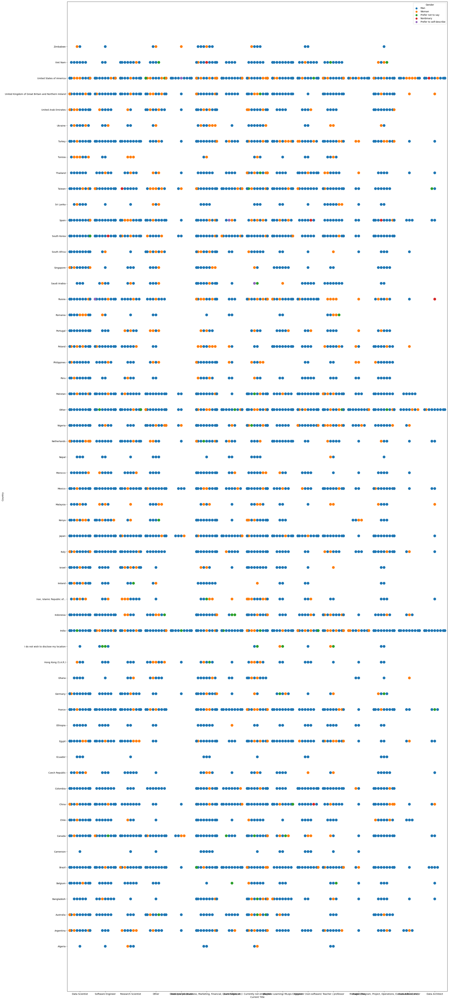

In [11]:
fig, ax = plt.subplots(figsize=(30,80))
p=sns.swarmplot(data=kaggle_2022, y="Country", x='Current Title', hue="Gender", size=12, ax=ax)
fig.set_dpi(100)

# <strong>Exploratory EDA - Let us do Count plot of unique questions</strong>


<li>1,2,3,24,29,90,145,146,147,148,149,158,159,283 </li>

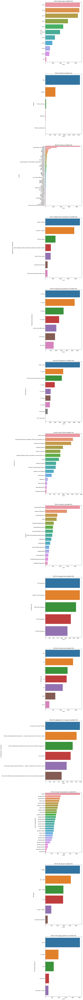

In [12]:
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
# new helper method to auto-label bars
single_item_list = [1,2,3,24,29,90,145,146,147,148,149,158,159,283]
num_plots = len(single_item_list)
total_cols = 1
total_rows = num_plots//total_cols
fig, axs = plt.subplots(nrows=total_rows, ncols=total_cols,
                        figsize=(7*total_cols, 7*total_rows*2), constrained_layout=False)
for i, var in enumerate(single_item_list):
    col=kaggle_2022_colnames[single_item_list[i]]
    row = i//total_cols
    pos = i % total_cols
    titles = 'Plot for ' + col + ' Count/Bar Plot'
    ax  = sns.countplot(y=col, data=kaggle_2022, ax=axs[row],order = kaggle_2022[col].value_counts().index).set(title=titles)
    i=i+1
    

# <strong> Country Specific Count Plot</strong>

[Text(0, 0, '8792'),
 Text(0, 0, '2920'),
 Text(0, 0, '1430'),
 Text(0, 0, '833'),
 Text(0, 0, '731'),
 Text(0, 0, '620'),
 Text(0, 0, '556'),
 Text(0, 0, '453'),
 Text(0, 0, '383'),
 Text(0, 0, '380'),
 Text(0, 0, '376'),
 Text(0, 0, '345'),
 Text(0, 0, '324'),
 Text(0, 0, '317'),
 Text(0, 0, '262'),
 Text(0, 0, '258'),
 Text(0, 0, '257'),
 Text(0, 0, '257'),
 Text(0, 0, '256'),
 Text(0, 0, '251'),
 Text(0, 0, '242'),
 Text(0, 0, '212'),
 Text(0, 0, '204'),
 Text(0, 0, '201'),
 Text(0, 0, '182'),
 Text(0, 0, '177'),
 Text(0, 0, '142'),
 Text(0, 0, '132'),
 Text(0, 0, '125'),
 Text(0, 0, '121'),
 Text(0, 0, '120'),
 Text(0, 0, '115'),
 Text(0, 0, '113'),
 Text(0, 0, '109'),
 Text(0, 0, '108'),
 Text(0, 0, '108'),
 Text(0, 0, '107'),
 Text(0, 0, '102'),
 Text(0, 0, '99'),
 Text(0, 0, '98'),
 Text(0, 0, '94'),
 Text(0, 0, '87'),
 Text(0, 0, '84'),
 Text(0, 0, '79'),
 Text(0, 0, '77'),
 Text(0, 0, '75'),
 Text(0, 0, '74'),
 Text(0, 0, '68'),
 Text(0, 0, '68'),
 Text(0, 0, '62'),
 Text(0, 

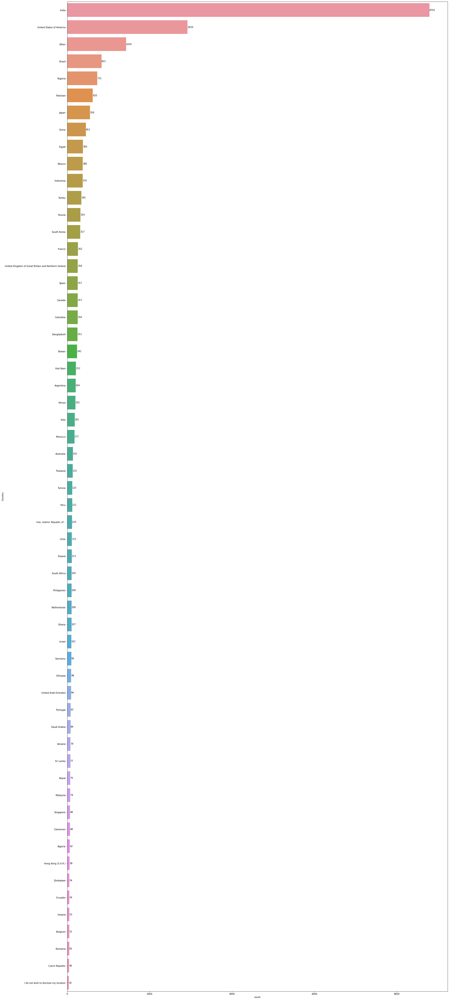

In [13]:
fig, ax = plt.subplots(figsize=(30,80))
ax = sns.countplot(y=kaggle_2022['Country'],order=kaggle_2022['Country'].value_counts(ascending=False).index)
abs_values = kaggle_2022['Country'].value_counts(ascending=False).values
ax.bar_label(container=ax.containers[0], labels=abs_values)

In [14]:
print('Total Number of Responses: ',kaggle_2022.shape[0])
responsesOnly_expanded2 = kaggle_2022
responsesOnly_expanded2 = pd.to_numeric(kaggle_2022['Duration'], errors='coerce')
responsesOnly_expanded2 = pd.DataFrame(kaggle_2022)
#save_number = [responsesOnly_expanded2[responsesOnly_expanded2['Duration'] > 0].shape[0]
save_number_1 =0
for i in range(1,20):
    responsesOnly_expanded2 = responsesOnly_expanded2[responsesOnly_expanded2['Duration'] > ((i*60)-1)]  
    print('Total Number of Respondents That Took more than ' + str(i) + ' Minutes: ',responsesOnly_expanded2.shape[0])
    save_number_2 = responsesOnly_expanded2.shape[0]
    save_number_1 = save_number_1 - responsesOnly_expanded2.shape[0]
    print('Total Number of Respondents using ' + str(i) + ' Minutes: ', save_number_1)
    save_number_1 = save_number_2 
    
   

Total Number of Responses:  23997

Total Number of Respondents That Took more than 1 Minutes:  23997

Total Number of Respondents using 1 Minutes:  -23997

Total Number of Respondents That Took more than 2 Minutes:  23997

Total Number of Respondents using 2 Minutes:  0

Total Number of Respondents That Took more than 3 Minutes:  21882

Total Number of Respondents using 3 Minutes:  2115

Total Number of Respondents That Took more than 4 Minutes:  19163

Total Number of Respondents using 4 Minutes:  2719

Total Number of Respondents That Took more than 5 Minutes:  16362

Total Number of Respondents using 5 Minutes:  2801

Total Number of Respondents That Took more than 6 Minutes:  13890

Total Number of Respondents using 6 Minutes:  2472

Total Number of Respondents That Took more than 7 Minutes:  11825

Total Number of Respondents using 7 Minutes:  2065

Total Number of Respondents That Took more than 8 Minutes:  10119

Total Number of Respondents using 8 Minutes:  1706

Total Number of Respondents That Took more than 9 Minutes:  8784

Total Number of Respondents using 9 Minutes:  1335

Total Number of Respondents That Took more than 10 Minutes:  7632

Total Number of Respondents using 10 Minutes:  1152

Total Number of Respondents That Took more than 11 Minutes:  6723

Total Number of Respondents using 11 Minutes:  909

Total Number of Respondents That Took more than 12 Minutes:  5944

Total Number of Respondents using 12 Minutes:  779

Total Number of Respondents That Took more than 13 Minutes:  5297

Total Number of Respondents using 13 Minutes:  647

Total Number of Respondents That Took more than 14 Minutes:  4760

Total Number of Respondents using 14 Minutes:  537

Total Number of Respondents That Took more than 15 Minutes:  4374

Total Number of Respondents using 15 Minutes:  386

Total Number of Respondents That Took more than 16 Minutes:  4018

Total Number of Respondents using 16 Minutes:  356

Total Number of Respondents That Took more than 17 Minutes:  3708

Total Number of Respondents using 17 Minutes:  310

Total Number of Respondents That Took more than 18 Minutes:  3506

Total Number of Respondents using 18 Minutes:  202

Total Number of Respondents That Took more than 19 Minutes:  3307

Total Number of Respondents using 19 Minutes:  199

# <strong>Define the Functions for plotting</strong>

In [15]:
def randomCMAP():
    import random
    CMAPLIST =['flag', 'prism', 'ocean', 'gist_earth', 
               'terrain','gist_stern', 'gnuplot', 'gnuplot2', 
               'CMRmap', 'cubehelix', 'brg', 'gist_rainbow', 
               'rainbow', 'jet', 'turbo', 'nipy_spectral', 
               'gist_ncar', 'Pastel1', 'Pastel2', 'Paired', 
               'Accent', 'Dark2','Set1', 'Set2', 'Set3', 
               'tab10', 'tab20', 'tab20b', 'tab20c', 
               'PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 
               'RdBu', 'RdYlBu', 'RdYlGn', 'Spectral',
               'coolwarm', 'bwr', 'seismic', 'binary', 
               'gist_yarg', 'gist_gray', 'gray', 'bone', 
               'pink', 'spring', 'summer', 'autumn', 
               'winter', 'cool','Wistia', 'hot', 'afmhot', 
               'gist_heat', 'copper'
              ]
    return random.choice(CMAPLIST)

def plot_heatmap(df,col1,col2):
    if col1 == 'Country' or col2 == 'Country':
        fig, ax = plt.subplots(1,1, figsize = (16,24))
    elif col1 == 'Annual Compensation' or col2 == 'Annual Compensation':
        fig, ax = plt.subplots(1,1, figsize = (16,24))
    else:
        fig, ax = plt.subplots(1,1, figsize = (12,6))
    hm = sns.heatmap(pd.crosstab(df[col1], df[col2]),
                             ax = ax,
                             cmap = randomCMAP(),
                             annot = True,
                             fmt = '.3f',
                             linewidths = 0.05)
    fig.subplots_adjust(top=0.93)
    fig.suptitle('Correlation Heatmap for ' + col1 + ' Vs ' + col2 + ' ', 
                  fontsize=18, 
                  fontweight='bold')


def plot_stackbar(df,col1,col2):
    if col1 == 'Country' or col2 == 'Country':
        fig, ax = plt.subplots(1,1, figsize = (16,24))
        ax = pd.crosstab(df[col1], df[col2]).plot.barh(stacked=True, edgecolor='none', ax=ax)
    elif col1 == 'Annual Compensation' or col2 == 'Annual Compensation':
        fig, ax = plt.subplots(1,1, figsize = (16,24))
        ax = pd.crosstab(df[col1], df[col2]).plot.barh(stacked=True, edgecolor='none', ax=ax)       
    else:
        fig, ax = plt.subplots(1,1, figsize = (12,6))
        ax = pd.crosstab(df[col1], df[col2]).plot.barh(stacked=True, edgecolor='none', ax=ax)
    horiz_offset = 1.03
    vert_offset = 1.
    ax.legend(bbox_to_anchor=(horiz_offset, vert_offset))
    fig.subplots_adjust(top=0.93)
    fig.suptitle('Stacked Bar Chart for ' + col1 + ' Vs ' + col2 + ' ', 
                  fontsize=18, 
                  fontweight='bold')

    


# <strong>Plotting Heatmap and Correlation Bar Plot for 'Country','Age Group'</strong>

### Inference : <strong> India , USA and Brazil <strong> have a strong correlation across groups

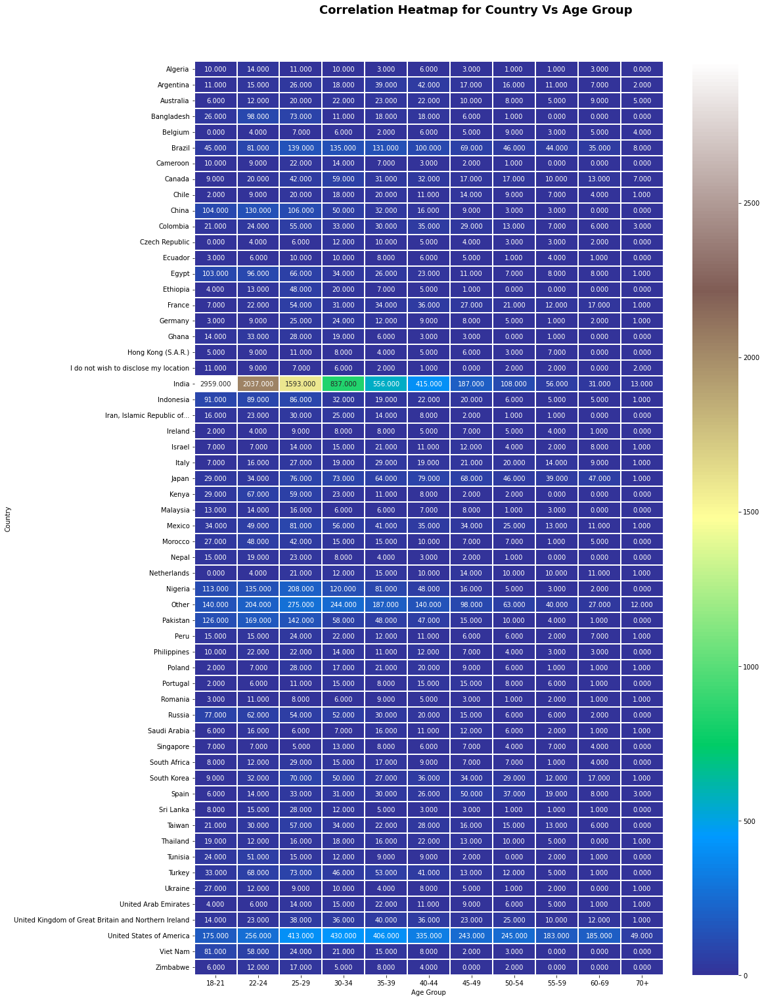

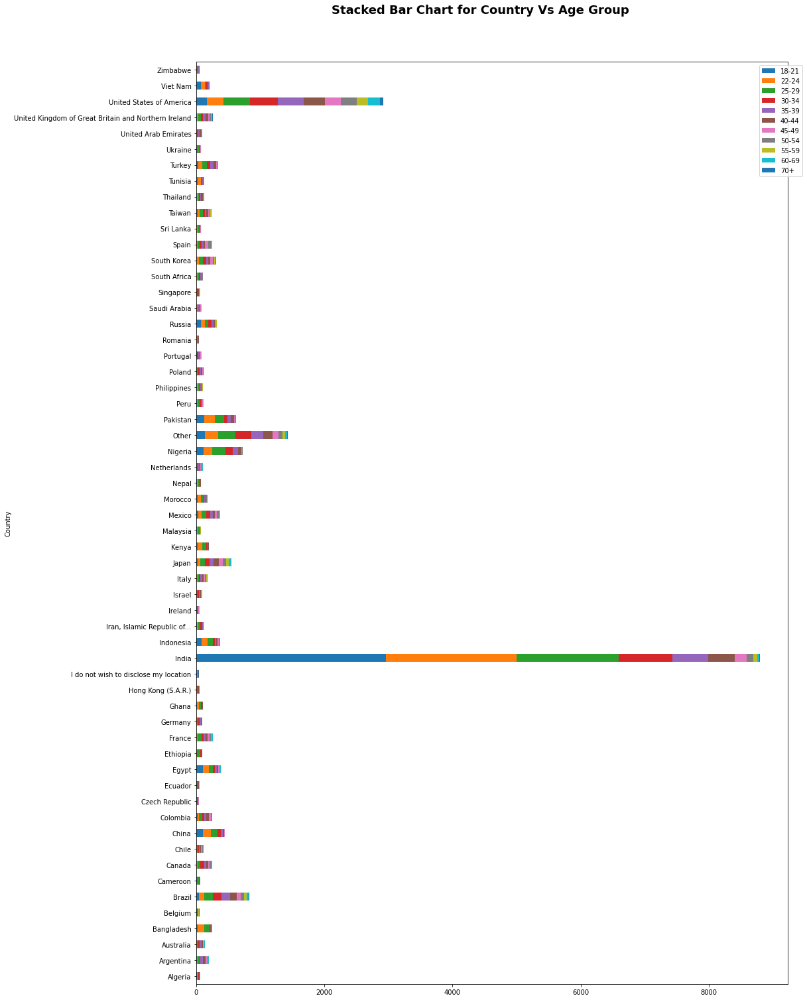

In [16]:
plot_heatmap(kaggle_2022, 'Country','Age Group')
plot_stackbar(kaggle_2022, 'Country','Age Group')


#  Country => Industry Plotting Heatmap and Correlation Bar Plot 

### Inference : <strong> India , USA and Brazil <strong> have a strong correlation across groups

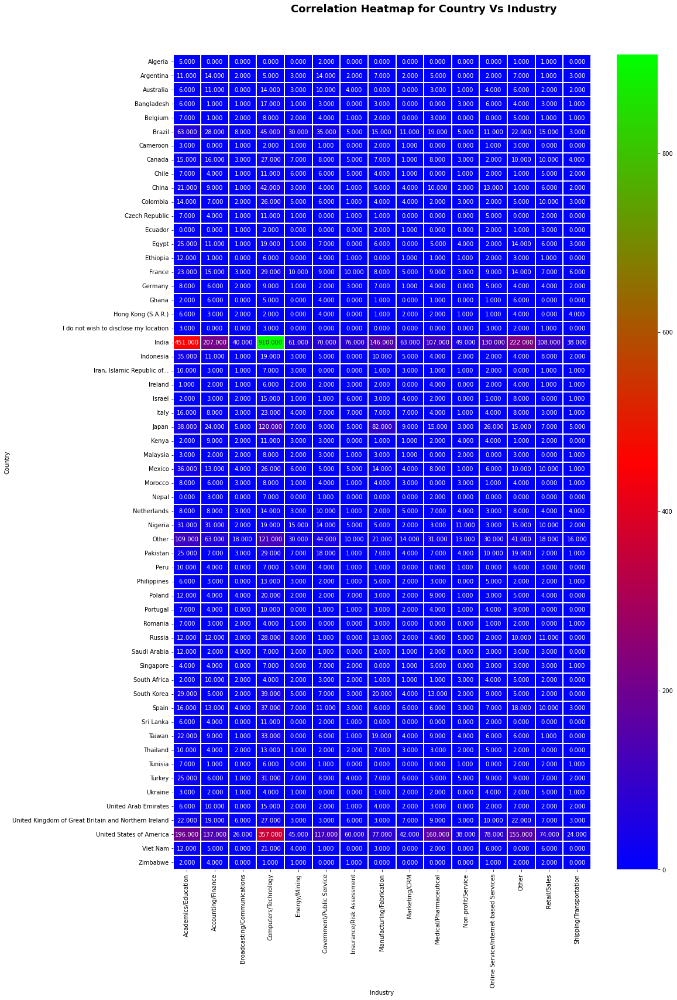

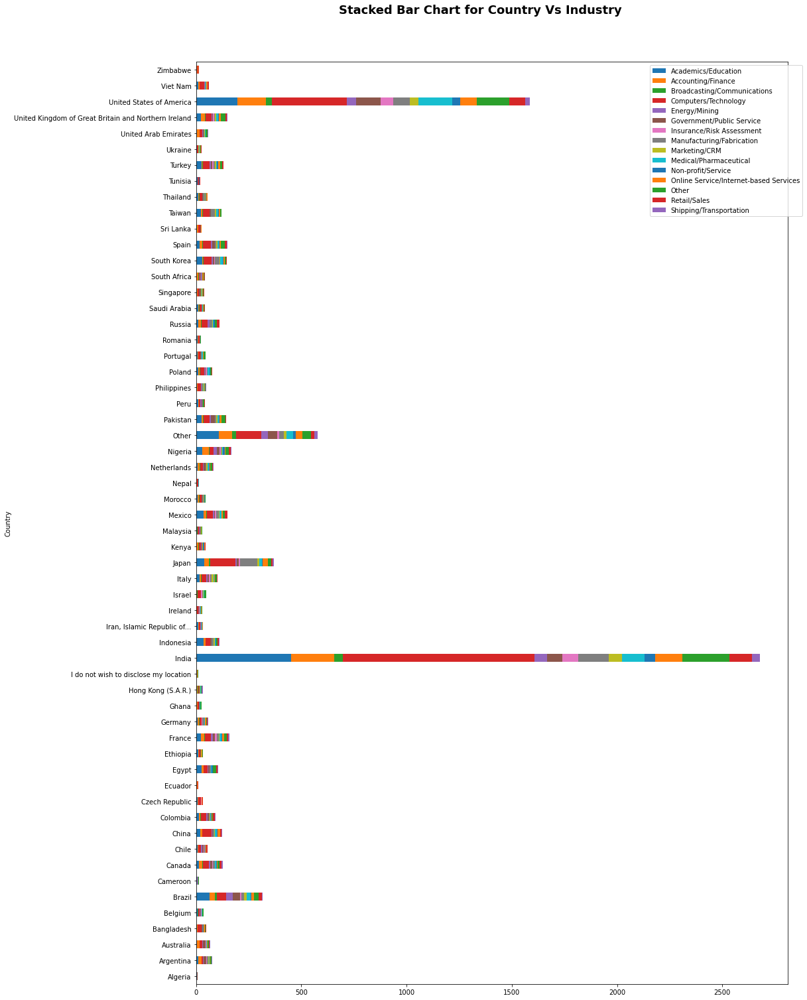

In [17]:
plot_heatmap(kaggle_2022, 'Country','Industry')
plot_stackbar(kaggle_2022, 'Country','Industry')


#  Country => Highest level of Education ==> Plotting Heatmap and Correlation Bar Plot 


### Inference : <strong> India , USA and rest of the group have most of data scientists who either have a bachelors or masters across groups

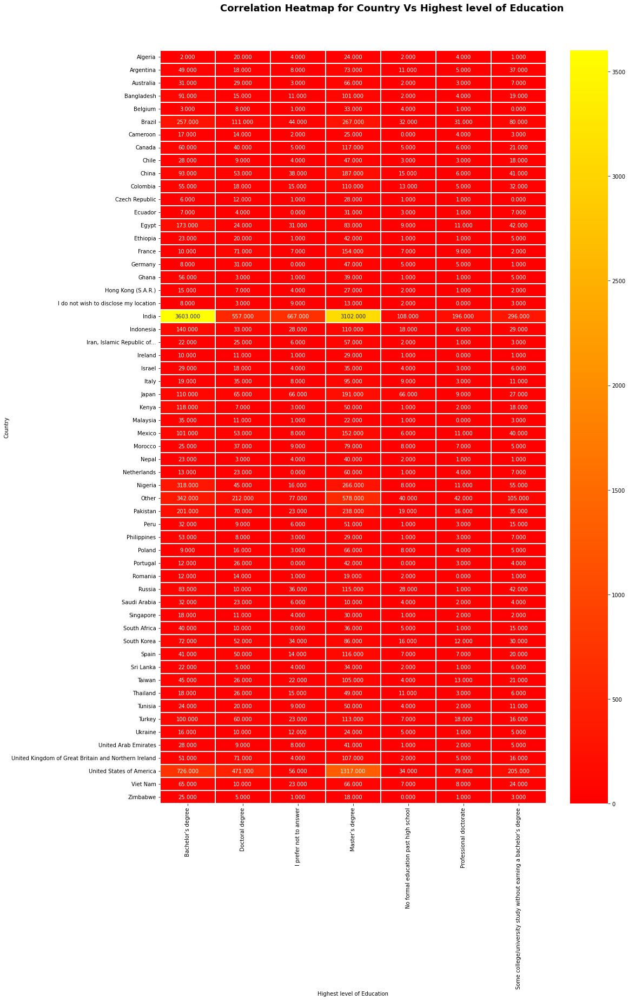

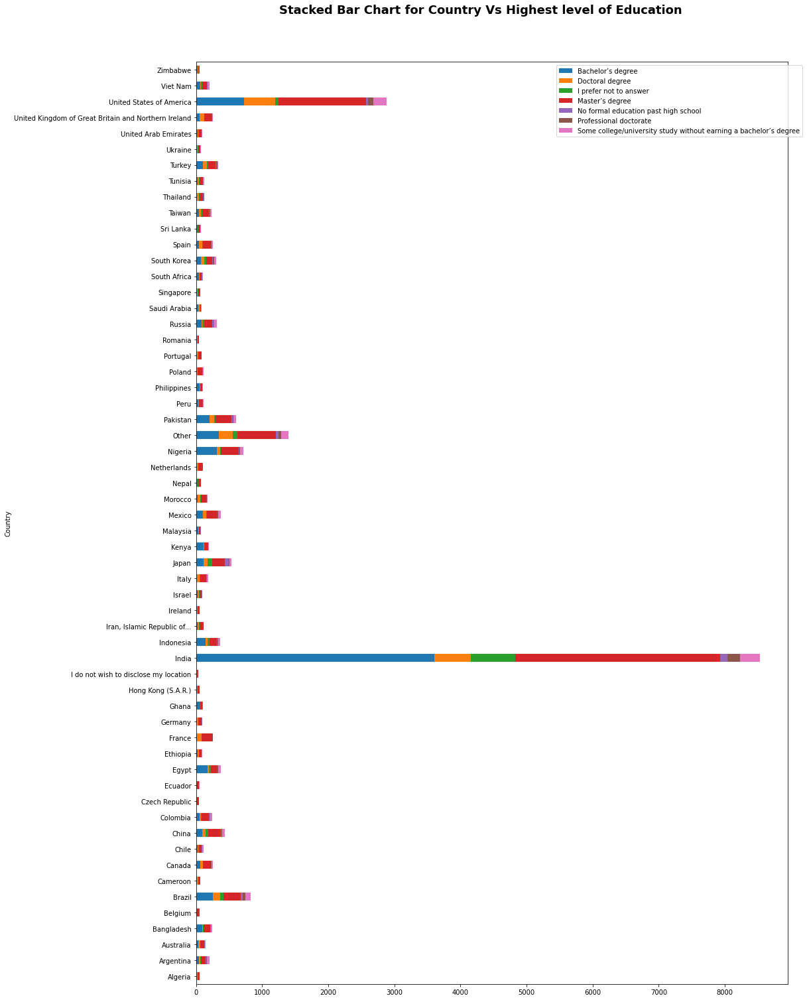

In [18]:
plot_heatmap(kaggle_2022, 'Country','Highest level of Education')
plot_stackbar(kaggle_2022, 'Country','Highest level of Education')


#  Country =>Gender ==> Plotting Heatmap and Correlation Bar Plot 📊


### Inference : <strong> India , USA </strong> have good women participation. <strong> USA </strong> has better percentage distribution

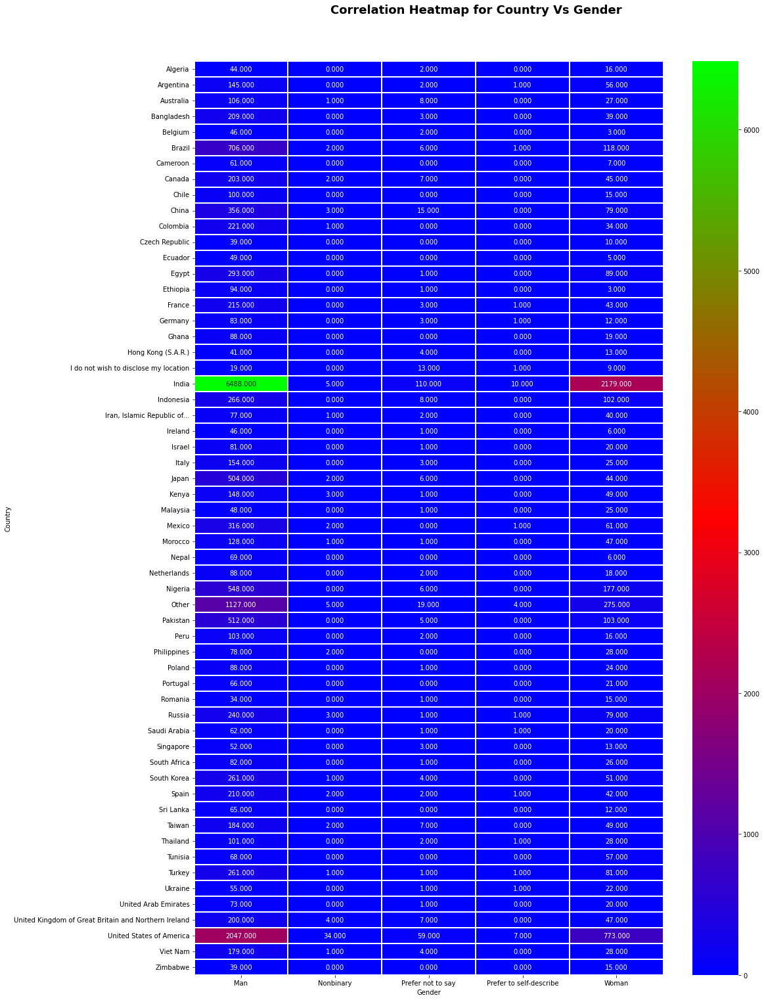

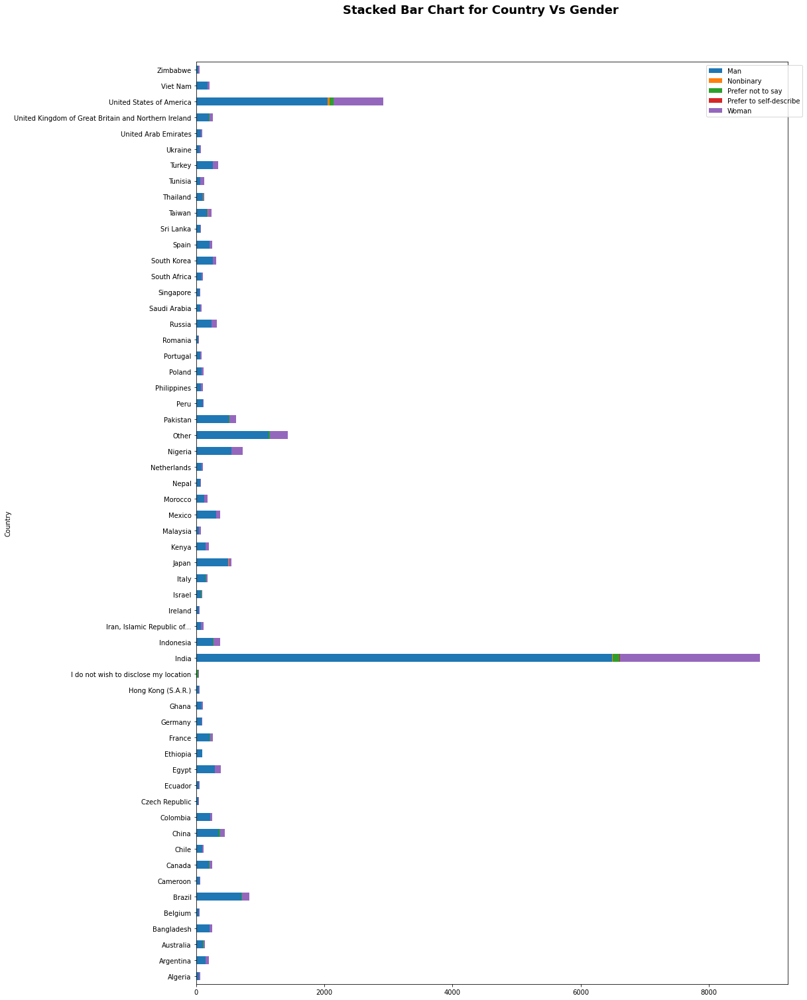

In [19]:
plot_heatmap(kaggle_2022, 'Country','Gender')
plot_stackbar(kaggle_2022, 'Country','Gender')


#  Country => Programming Experience ==> Plotting Heatmap and Correlation Bar Plot 📊


### Inference : <strong> India , USA </strong> have good spread participation. <strong> USA </strong> has more senior programmers. India has mostly student population in the survey and hence it shows in the category

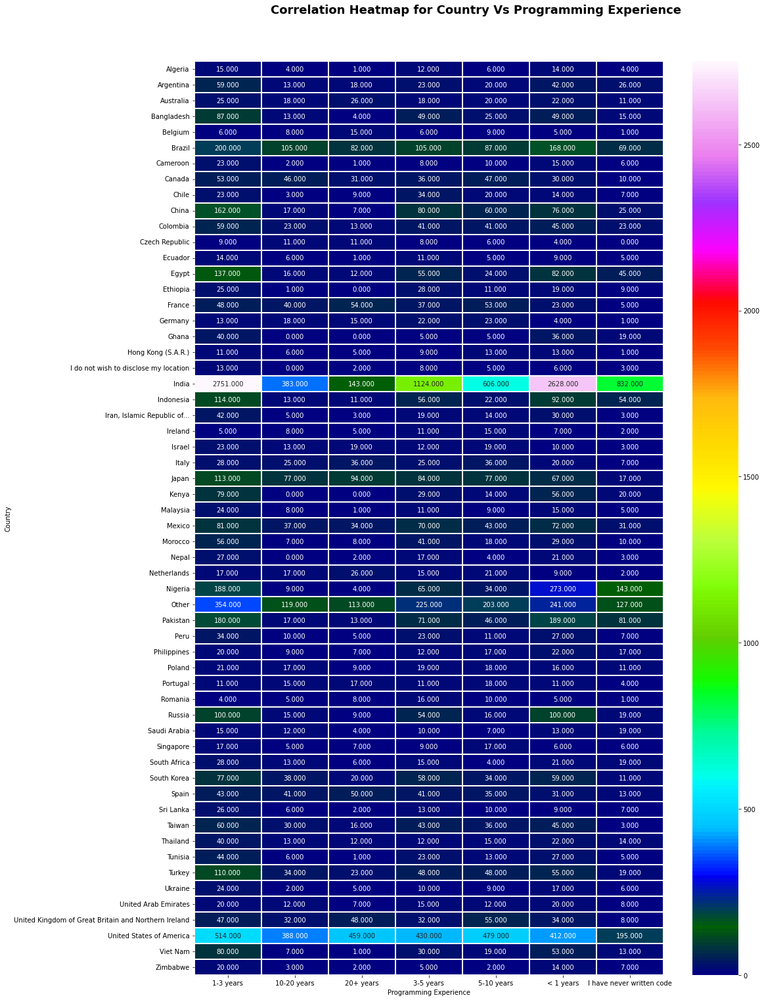

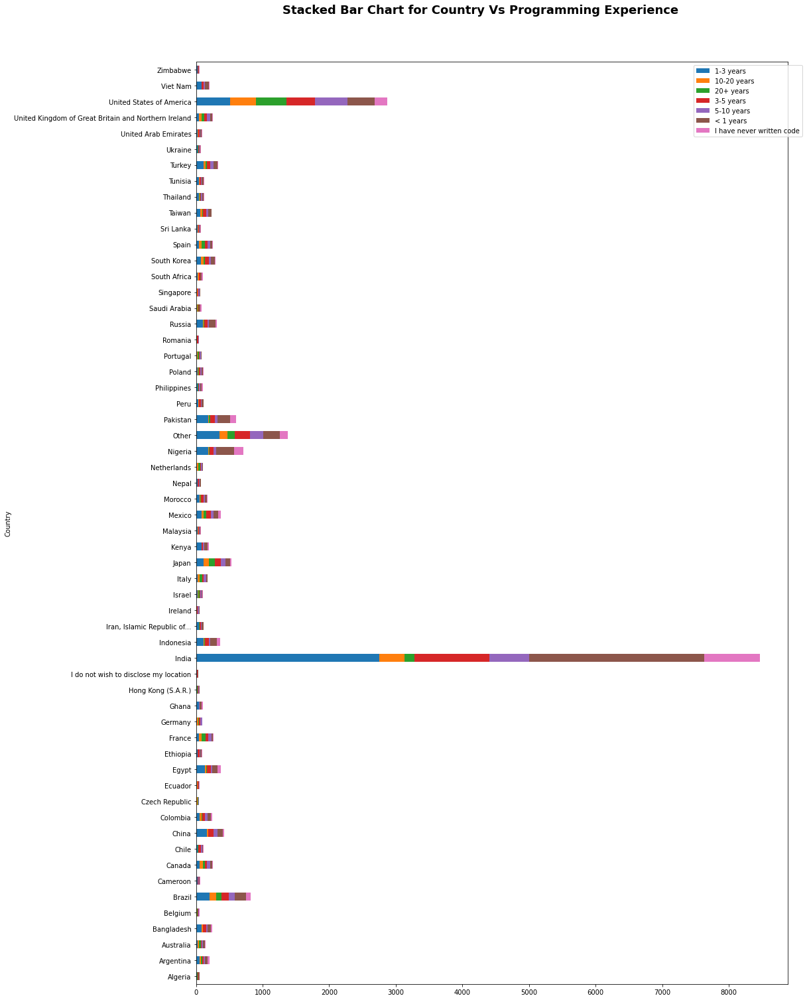

In [20]:
plot_heatmap(kaggle_2022, 'Country','Programming Experience')
plot_stackbar(kaggle_2022, 'Country','Programming Experience')


#  Industry => 'Highest level of Education' ==> Plotting Heatmap and Correlation Bar Plot 📊


### Inference : 
<ul><li><strong> Academics</strong> have most of the doctorates</li>
    <li>Computers / Tech Industry had mostly Masters </li>
    <li>Accounting and Finance industry has good amount of Bachelors </li>
</ul>

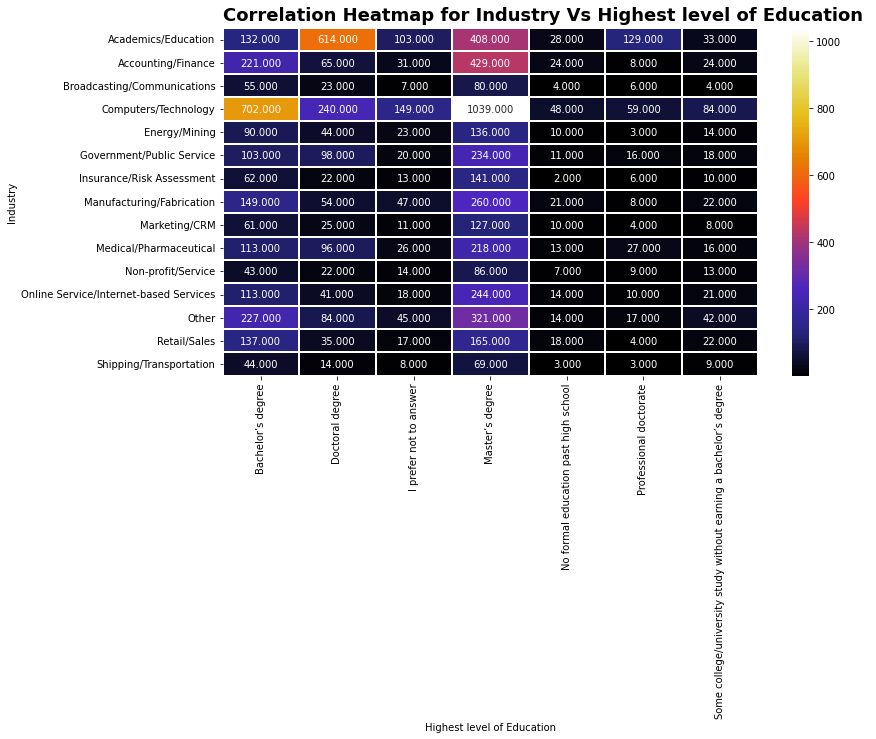

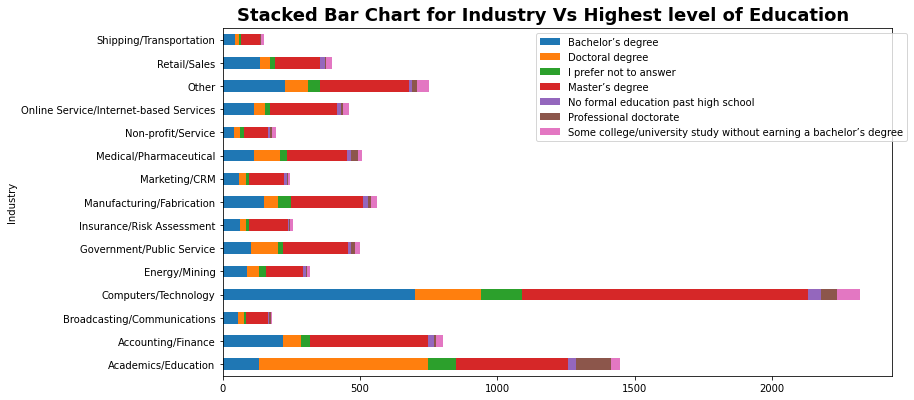

In [21]:
plot_heatmap(kaggle_2022, 'Industry','Highest level of Education')
plot_stackbar(kaggle_2022, 'Industry','Highest level of Education')


#  Industry => 'Gender' ==> Plotting Heatmap and Correlation Bar Plot 📊


### Inference : 
<ul><li><strong> Computer/Tech Industry or Academixs have mostly men and good women participation as well. Less open sharing of gender preference in the survey</li>
</ul>

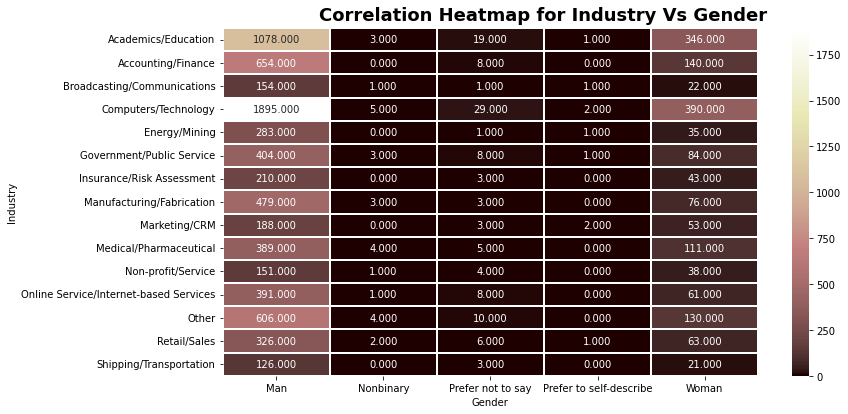

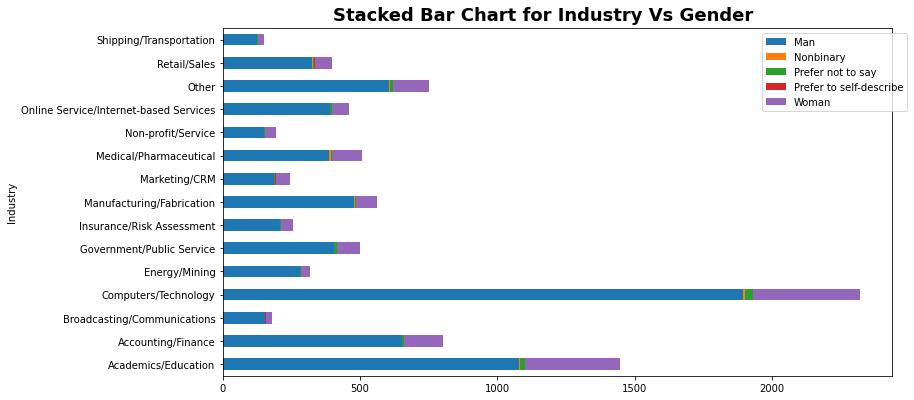

In [22]:
plot_heatmap(kaggle_2022, 'Industry','Gender')
plot_stackbar(kaggle_2022, 'Industry','Gender')


#  Industry => 'Programming Experience' ==> Plotting Heatmap and Correlation Bar Plot 📊


### Inference : 
<ul>
    <li>
        <strong>
            Mostly 5 to 10 years experience
        </strong>
    </li>
     <li>
        <strong>
            Academics have longer experience span
        </strong>
    </li>
</ul>

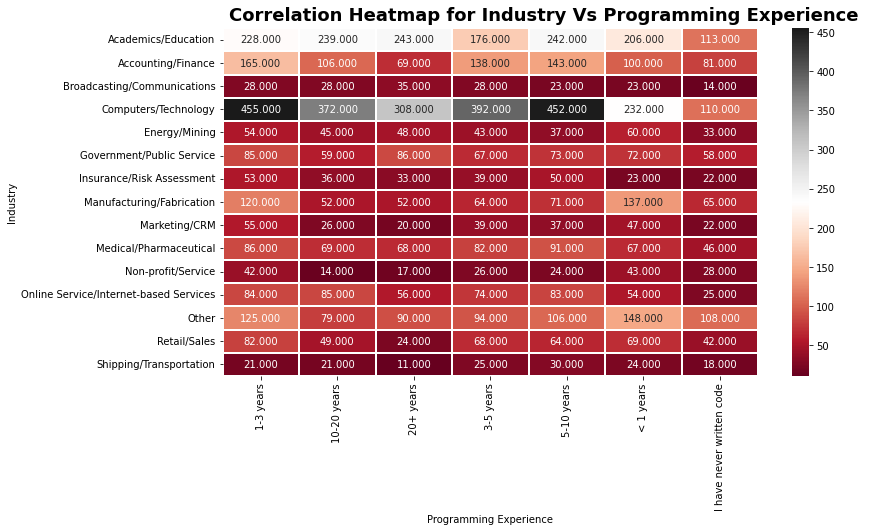

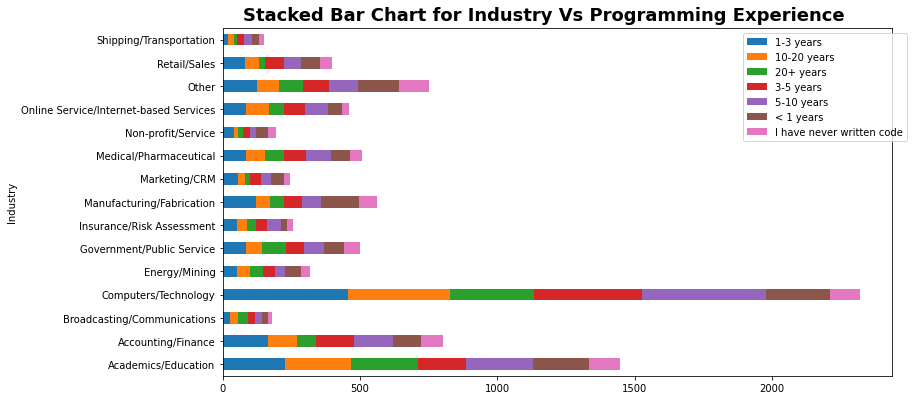

In [23]:
plot_heatmap(kaggle_2022, 'Industry','Programming Experience')
plot_stackbar(kaggle_2022, 'Industry','Programming Experience')


#  'Age Group'=>'Gender'==> Plotting Heatmap and Correlation Bar Plot 📊


### Inference : 
<ul>
    <li>
        <strong>
            Mostly 25-29 and 30-34 are the top two groups across gender
        </strong>
    </li>
     <li>
        <strong>
            Decent number of respondents across spectrum of 18-21 and 70+ categories
        </strong>
    </li>
</ul>

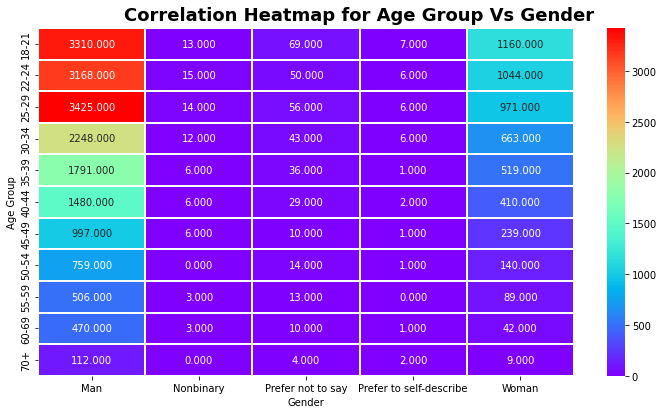

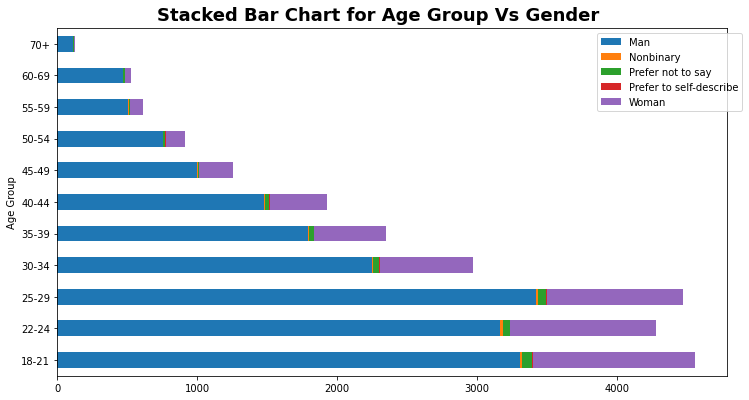

In [24]:
plot_heatmap(kaggle_2022, 'Age Group','Gender')
plot_stackbar(kaggle_2022, 'Age Group','Gender')

#  'Age Group'=>'Highest level of Education'==> Plotting Heatmap and Correlation Bar Plot 📊

### Inference : 
<ul>
    <li>
        <strong>
            Mostly 25-29 and 30-34 are the top two groups across gender gace nasrers 
        </strong>
    </li>
     <li>
        <strong>
            Decent number of doctorates from 30-34+ group
    </li>
</ul>

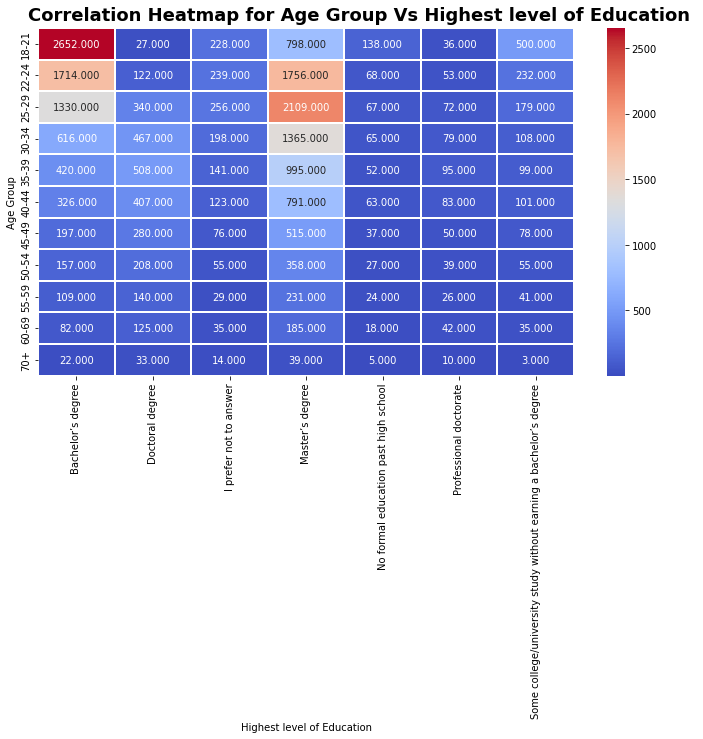

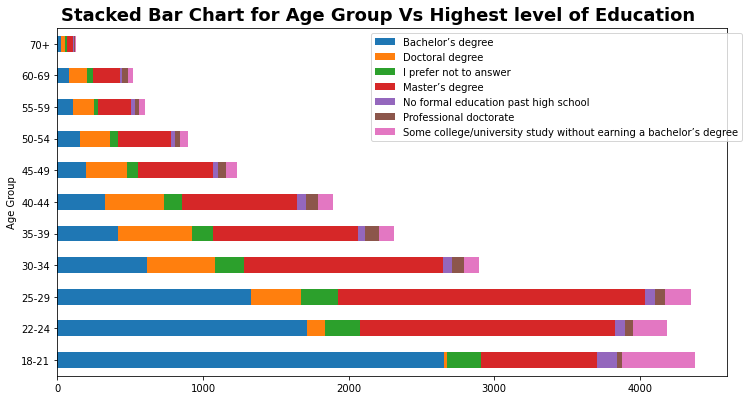

In [25]:
plot_heatmap(kaggle_2022, 'Age Group','Highest level of Education')
plot_stackbar(kaggle_2022, 'Age Group','Highest level of Education')

#  'Age Group'=>'Programming Experience'==> Plotting Heatmap and Correlation Bar Plot 📊

### Inference : <strong> 25-29 yea </strong> have good spread participation. <strong> USA </strong> has more senior programmers. India has mostly student population in the survey and hence it shows in the category

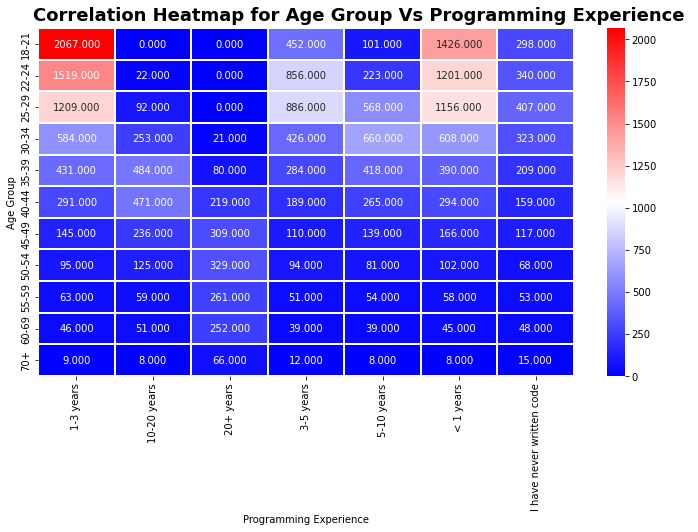

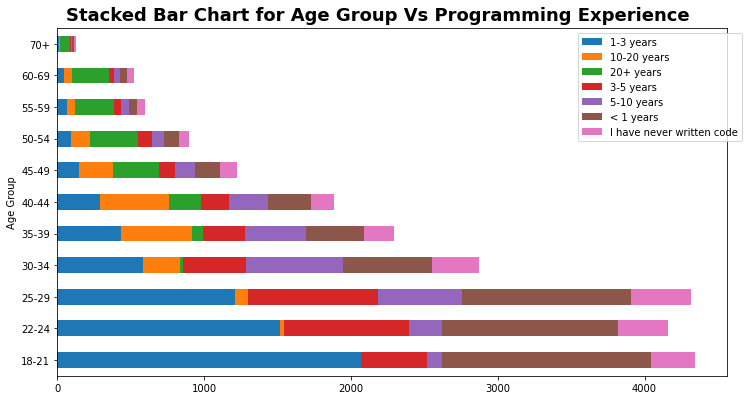

In [26]:
plot_heatmap(kaggle_2022, 'Age Group','Programming Experience')
plot_stackbar(kaggle_2022, 'Age Group','Programming Experience')

#  'Age Group'=>'ML Experience'==> Plotting Heatmap and Correlation Bar Plot 📊

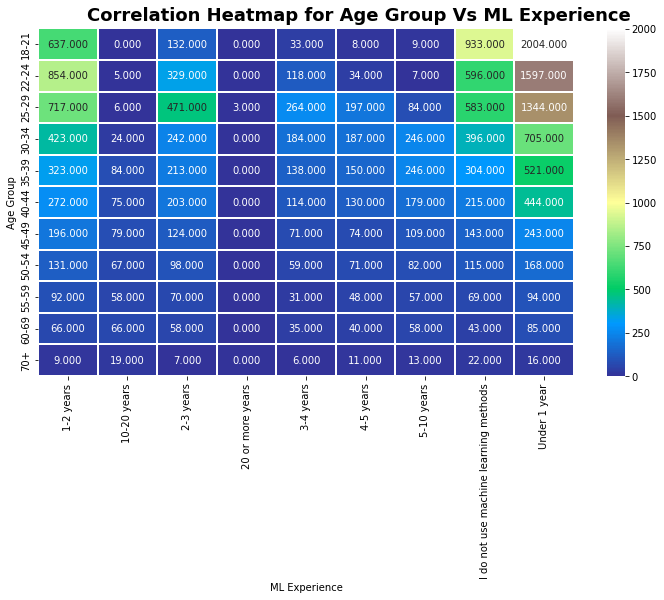

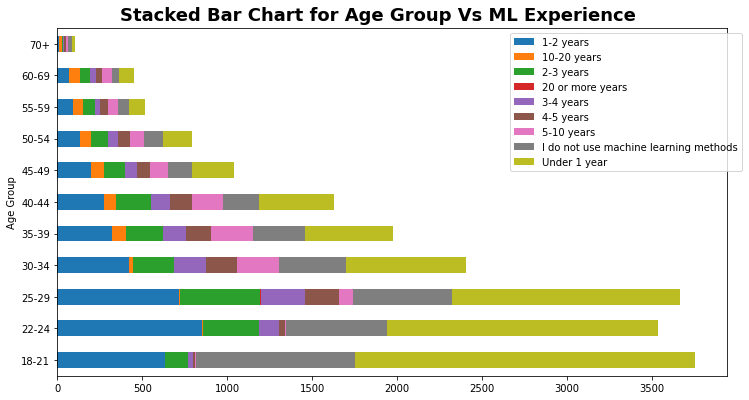

In [27]:
plot_heatmap(kaggle_2022, 'Age Group','ML Experience')
plot_stackbar(kaggle_2022, 'Age Group','ML Experience')

#  'Company Size'=>'Programming Experience'==> Plotting Heatmap and Correlation Bar Plot 📊

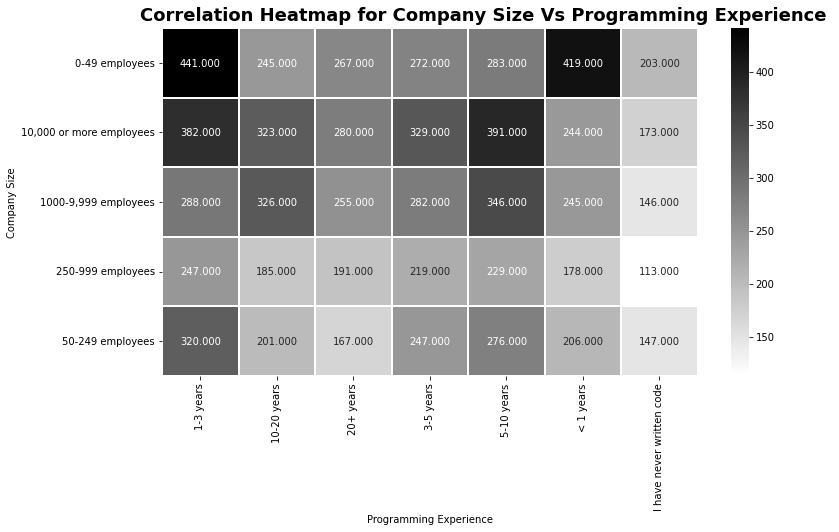

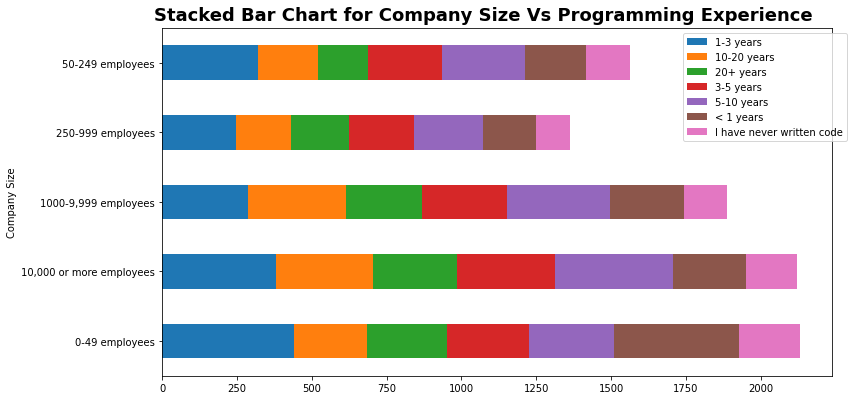

In [28]:
plot_heatmap(kaggle_2022, 'Company Size','Programming Experience')
plot_stackbar(kaggle_2022, 'Company Size','Programming Experience')

#  'Company Size'=>'Data Science Team Size'==> Plotting Heatmap and Correlation Bar Plot 📊

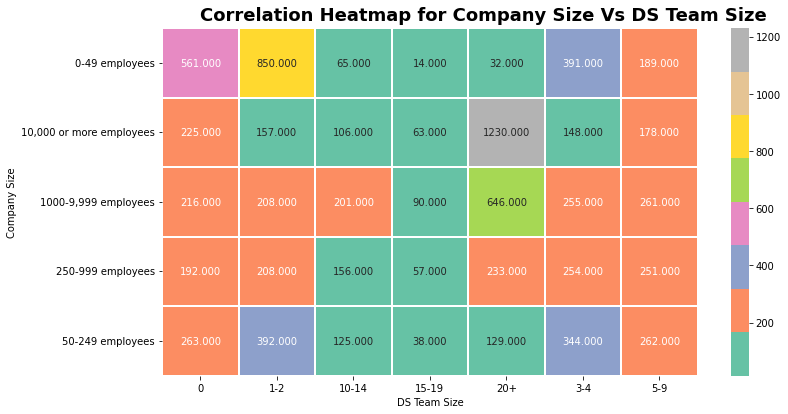

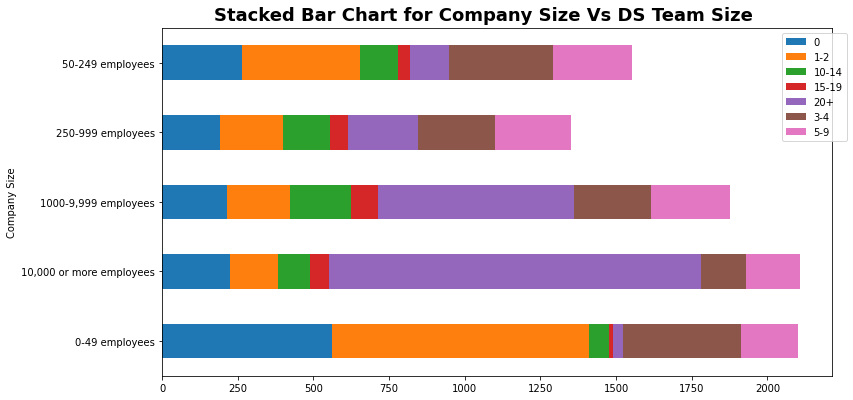

In [29]:
plot_heatmap(kaggle_2022, 'Company Size','DS Team Size')
plot_stackbar(kaggle_2022, 'Company Size','DS Team Size')

#  'Company Size'=>'ML Application in Company'==> Plotting Heatmap and Correlation Bar Plot 📊

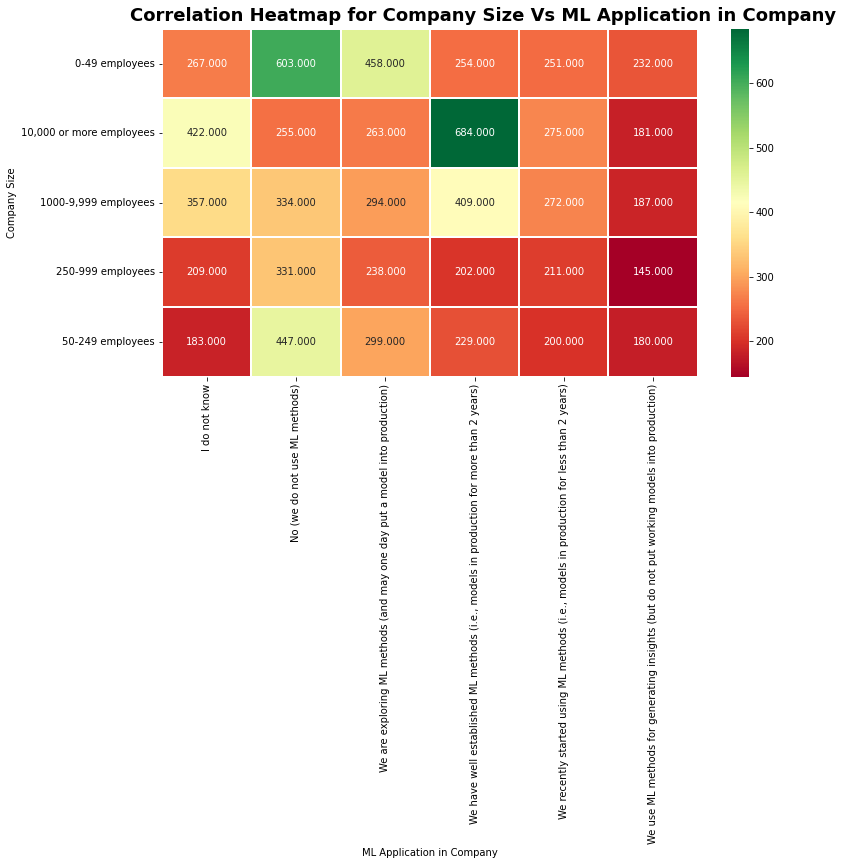

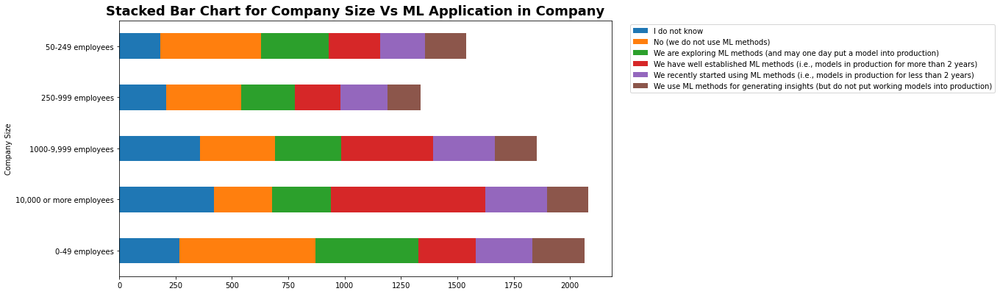

In [30]:
plot_heatmap(kaggle_2022, 'Company Size','ML Application in Company')
plot_stackbar(kaggle_2022, 'Company Size','ML Application in Company')

#  'Company Size'=>'ML Spend'==> Plotting Heatmap and Correlation Bar Plot 📊

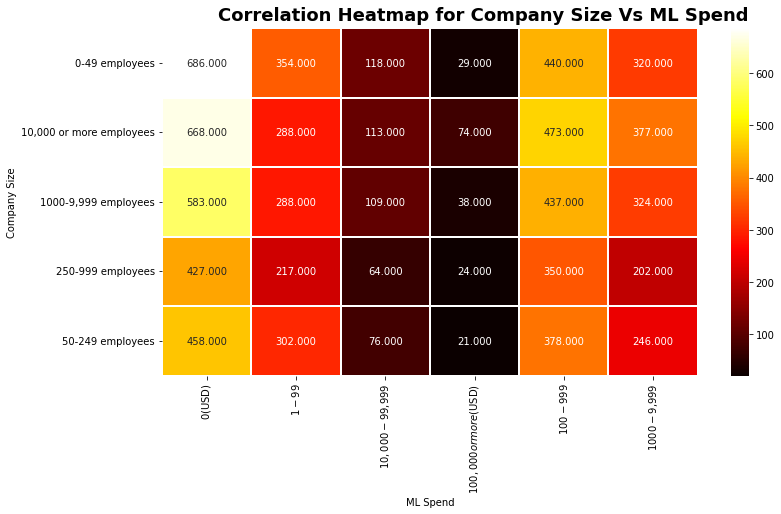

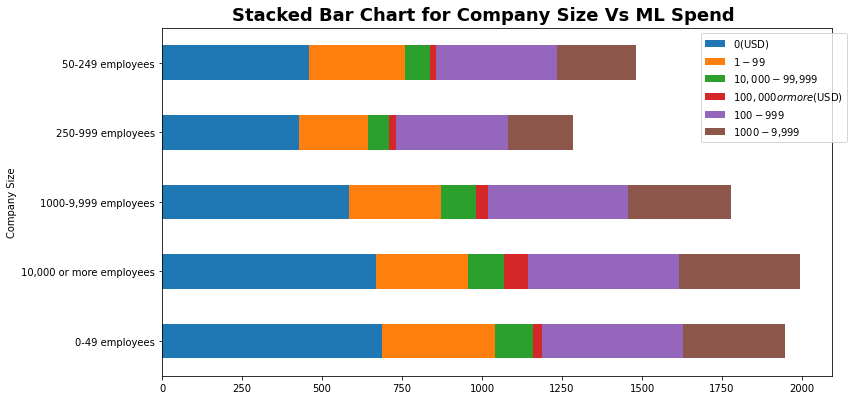

In [31]:
plot_heatmap(kaggle_2022, 'Company Size','ML Spend')
plot_stackbar(kaggle_2022, 'Company Size','ML Spend')

#  'Company Size'=>'Annual Compensation'==> Plotting Heatmap and Correlation Bar Plot 📊

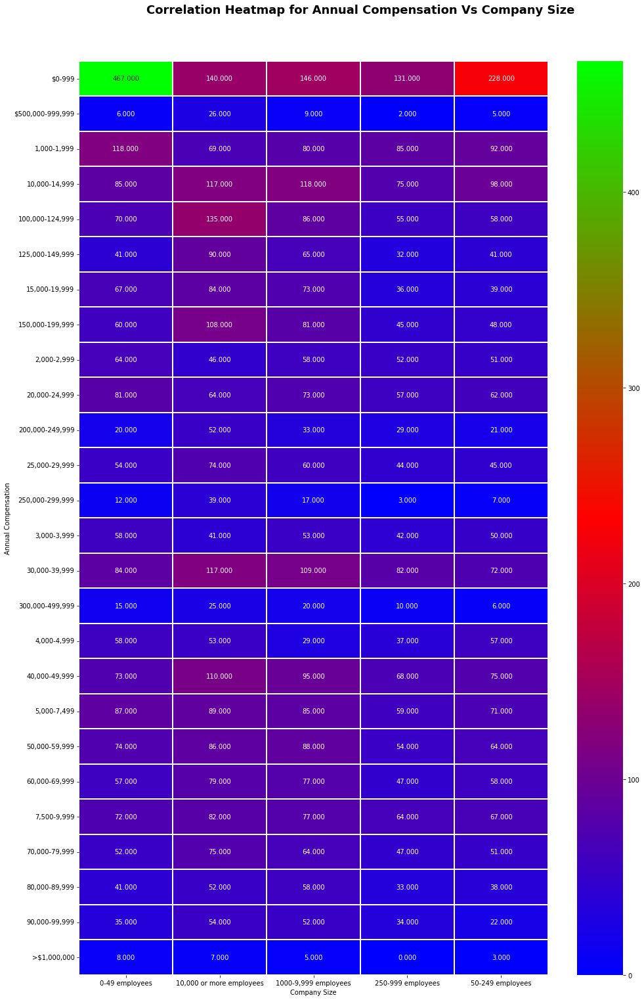

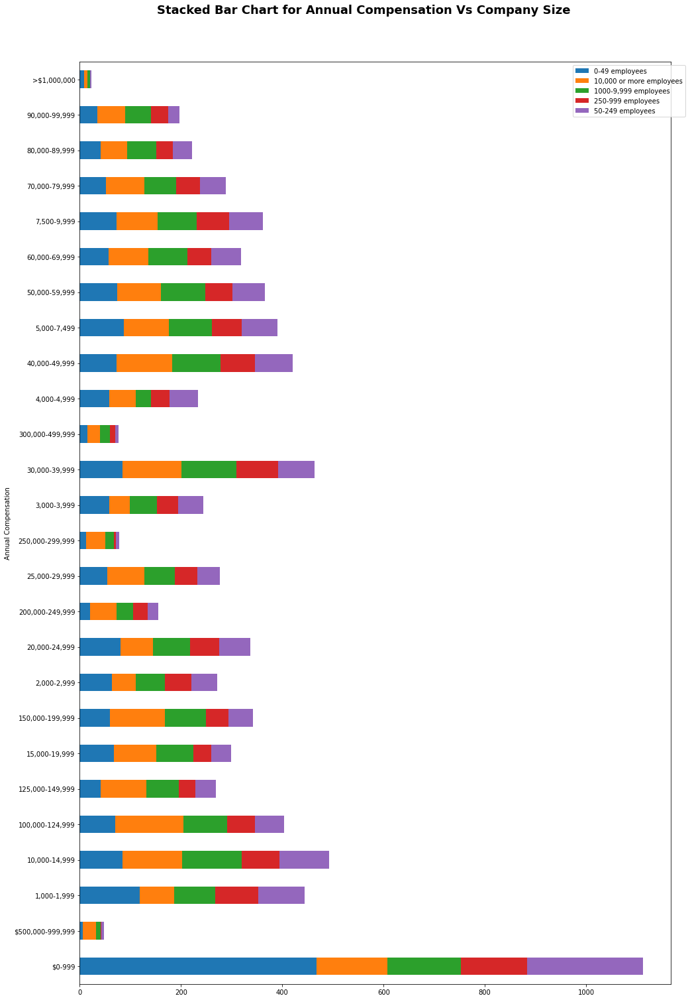

In [32]:
plot_heatmap(kaggle_2022, 'Annual Compensation','Company Size')
plot_stackbar(kaggle_2022, 'Annual Compensation','Company Size')

#  'Company Size'=>'Current Title'==> Plotting Heatmap and Correlation Bar Plot 📊

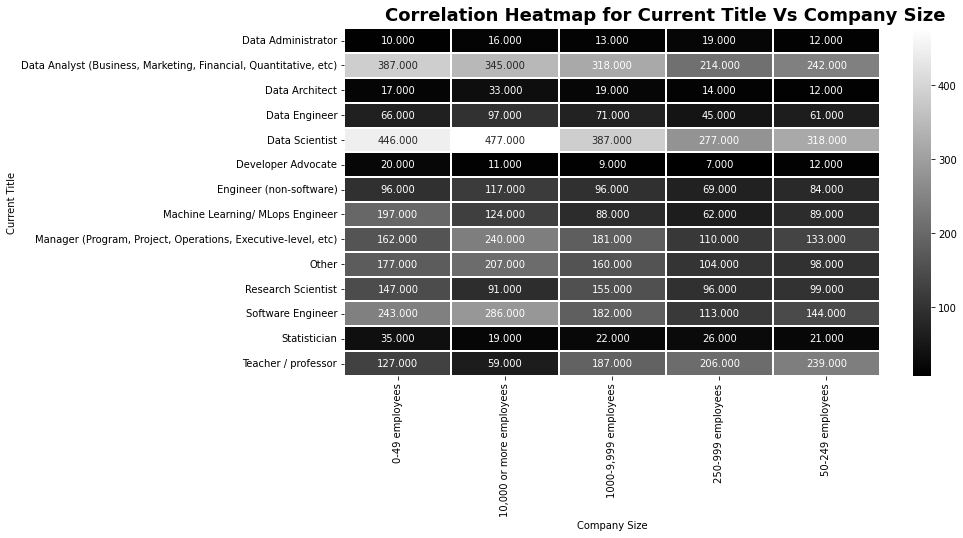

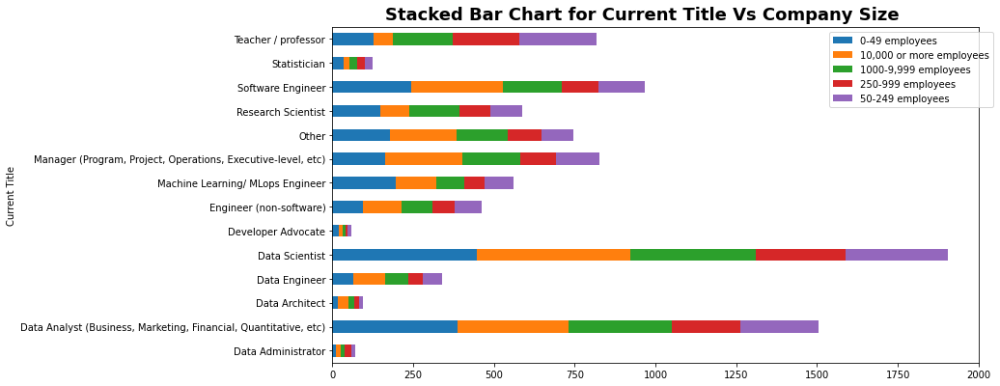

In [33]:
plot_heatmap(kaggle_2022, 'Current Title','Company Size')
plot_stackbar(kaggle_2022, 'Current Title','Company Size')

#  'Age Group'=>'Annual Compensation'==> Plotting Heatmap and Correlation Bar Plot 📊

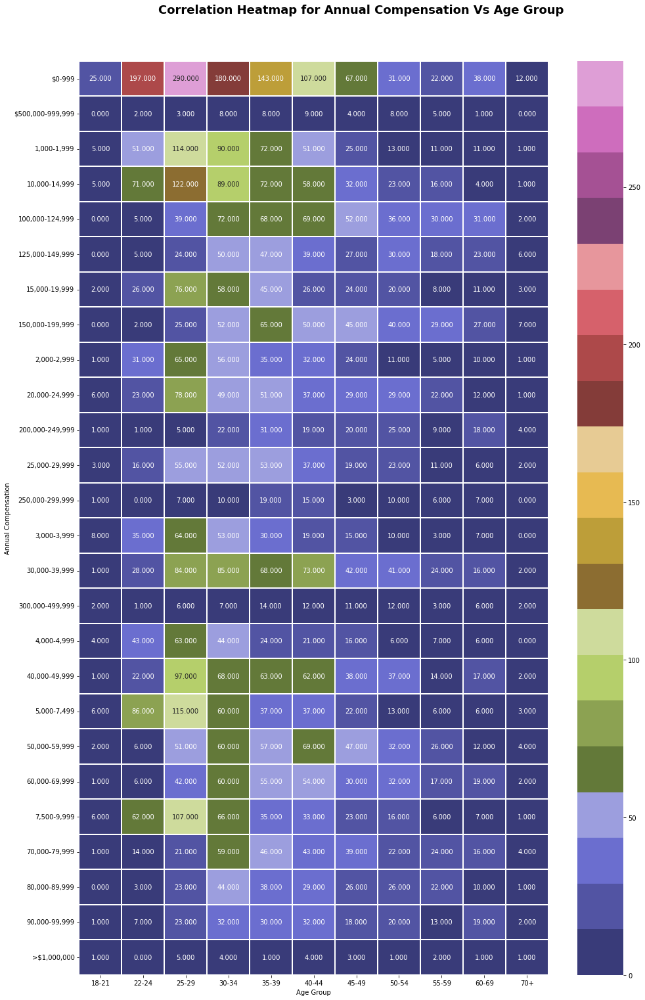

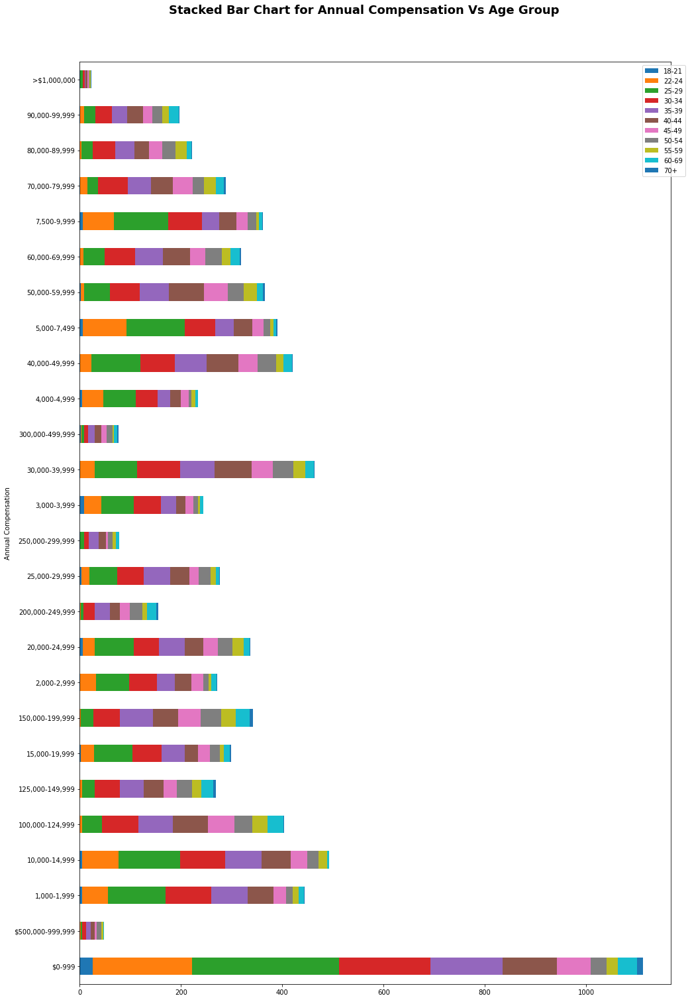

In [34]:
plot_heatmap(kaggle_2022, 'Annual Compensation','Age Group')
plot_stackbar(kaggle_2022, 'Annual Compensation', 'Age Group')

#  'Age Group'=>'Company Size'==> Plotting Heatmap and Correlation Bar Plot 📊

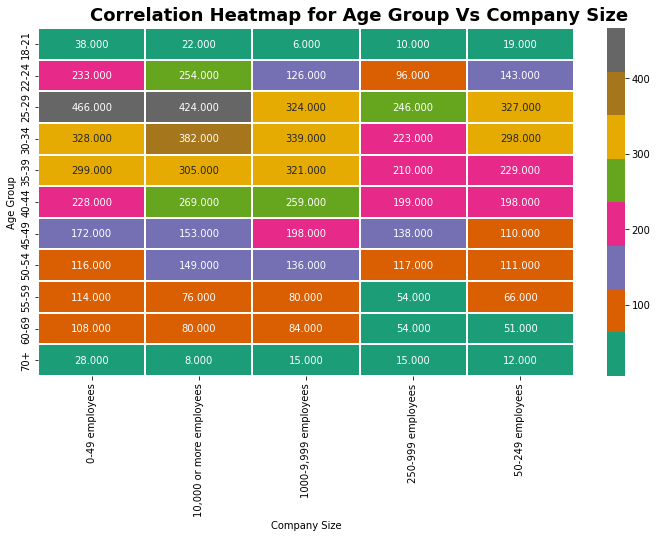

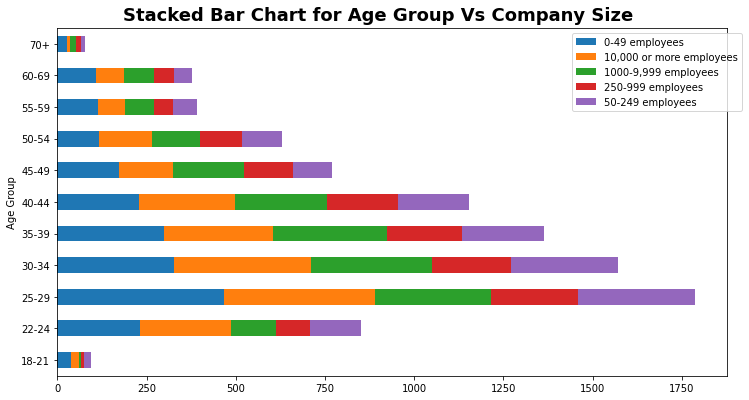

In [35]:
plot_heatmap(kaggle_2022, 'Age Group','Company Size')
plot_stackbar(kaggle_2022, 'Age Group','Company Size')

In [36]:
'''
group_list = ['Country','Industry',
              'Highest level of Education',
              'Gender','Programming Experience']
map_list = ['Duration','Age Group', 'ML Experience', 
            'Current Title', 'Company Size', 
            'DS Team Size', 'ML Application in Company', 
            'Annual Compensation','ML Spend',]

for i in group_list:
    for j in map_list:
        plot_heatmap(kaggle_2022, i,j)
        plot_stackbar(kaggle_2022, i,j)

for i in range(len(group_list)-1):
    plot_heatmap(kaggle_2022, group_list[i],group_list[i+1])
    plot_stackbar(kaggle_2022,group_list[i],group_list[i+1])
'''

"\ngroup_list = ['Country','Industry',\n              'Highest level of Education',\n              'Gender','Programming Experience']\nmap_list = ['Duration','Age Group', 'ML Experience', \n            'Current Title', 'Company Size', \n            'DS Team Size', 'ML Application in Company', \n            'Annual Compensation','ML Spend',]\n\nfor i in group_list:\n    for j in map_list:\n        plot_heatmap(kaggle_2022, i,j)\n        plot_stackbar(kaggle_2022, i,j)\n\nfor i in range(len(group_list)-1):\n    plot_heatmap(kaggle_2022, group_list[i],group_list[i+1])\n    plot_stackbar(kaggle_2022,group_list[i],group_list[i+1])\n"

#  'ML Application in Company' ==> 'ML Spend''==> Plotting Heatmap and Correlation Bar Plot 📊

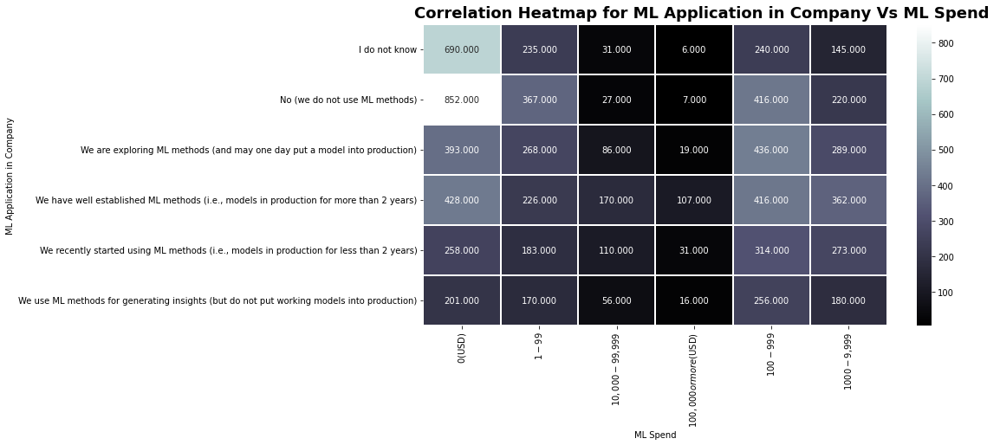

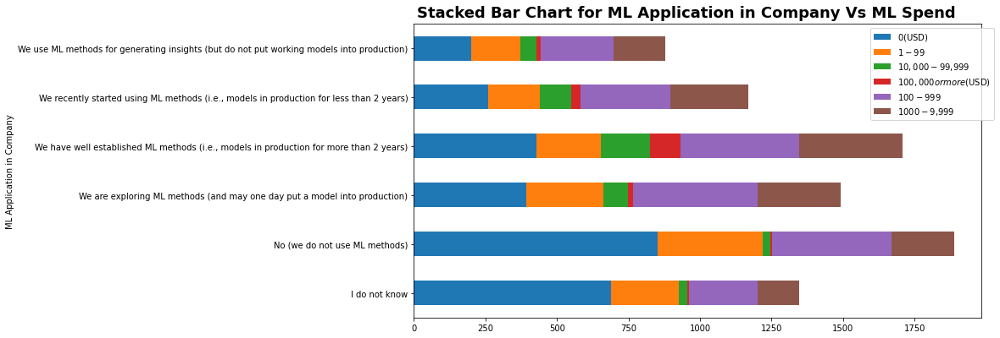

In [37]:
plot_heatmap(kaggle_2022, 'ML Application in Company' , 'ML Spend')
plot_stackbar(kaggle_2022, 'ML Application in Company' , 'ML Spend')

#  'Current Title' '==> 'Gender'==> Plotting Heatmap and Correlation Bar Plot 📊

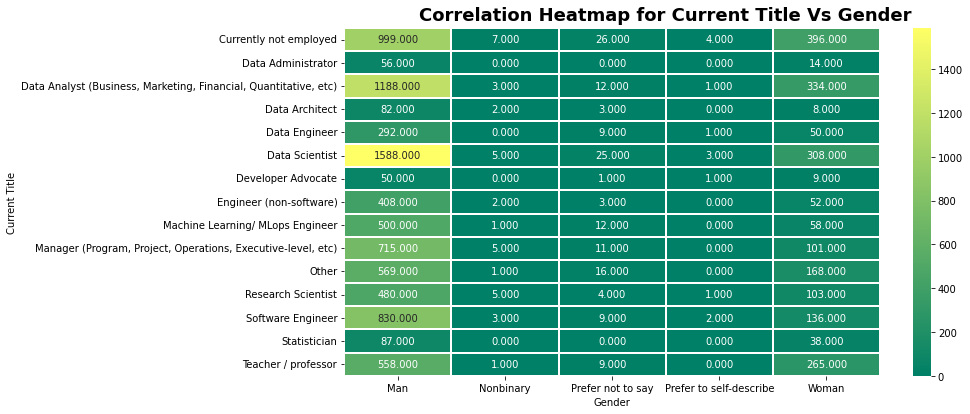

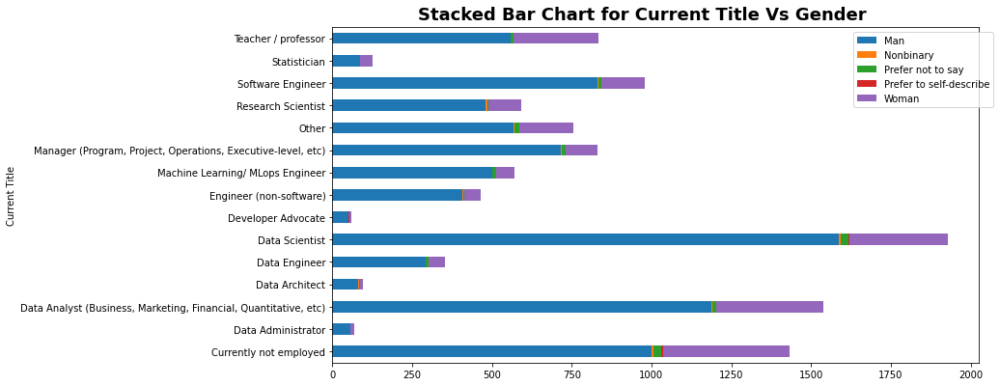

In [38]:
plot_heatmap(kaggle_2022, 'Current Title' , 'Gender')
plot_stackbar(kaggle_2022, 'Current Title' , 'Gender')

#  'Current Title' '==> 'Age Group'==> Plotting Heatmap and Correlation Bar Plot 📊

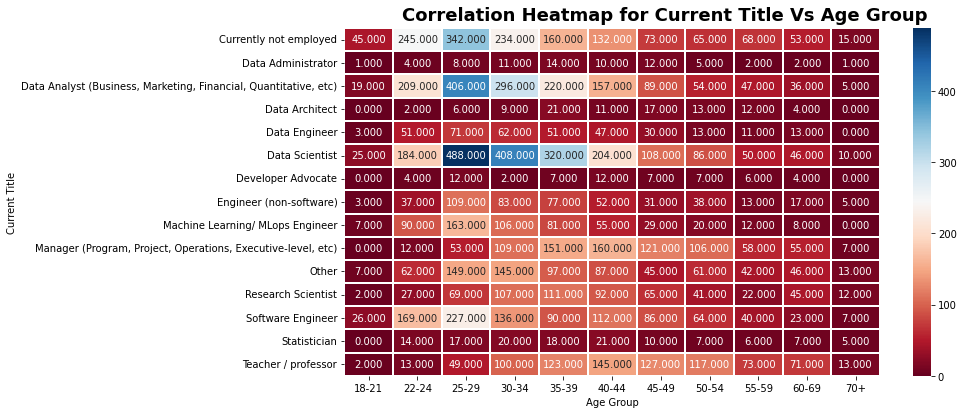

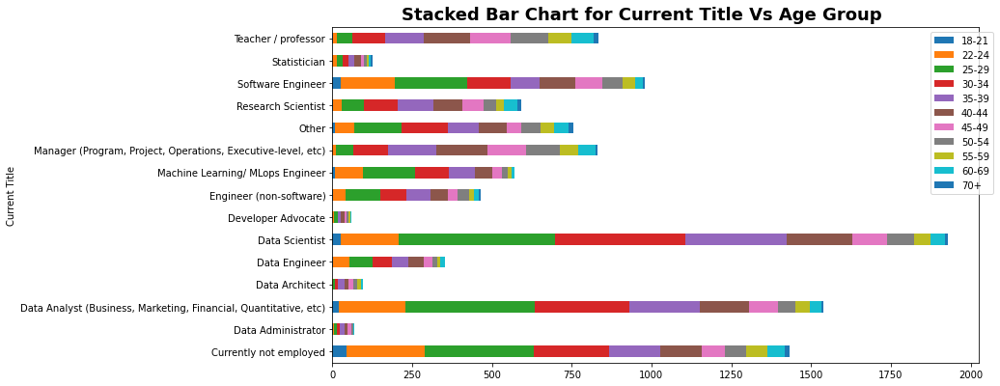

In [39]:
plot_heatmap(kaggle_2022, 'Current Title' , 'Age Group')
plot_stackbar(kaggle_2022, 'Current Title' , 'Age Group')

#  'Current Title' '==> 'Annual Compensation'==> Plotting Heatmap and Correlation Bar Plot 📊

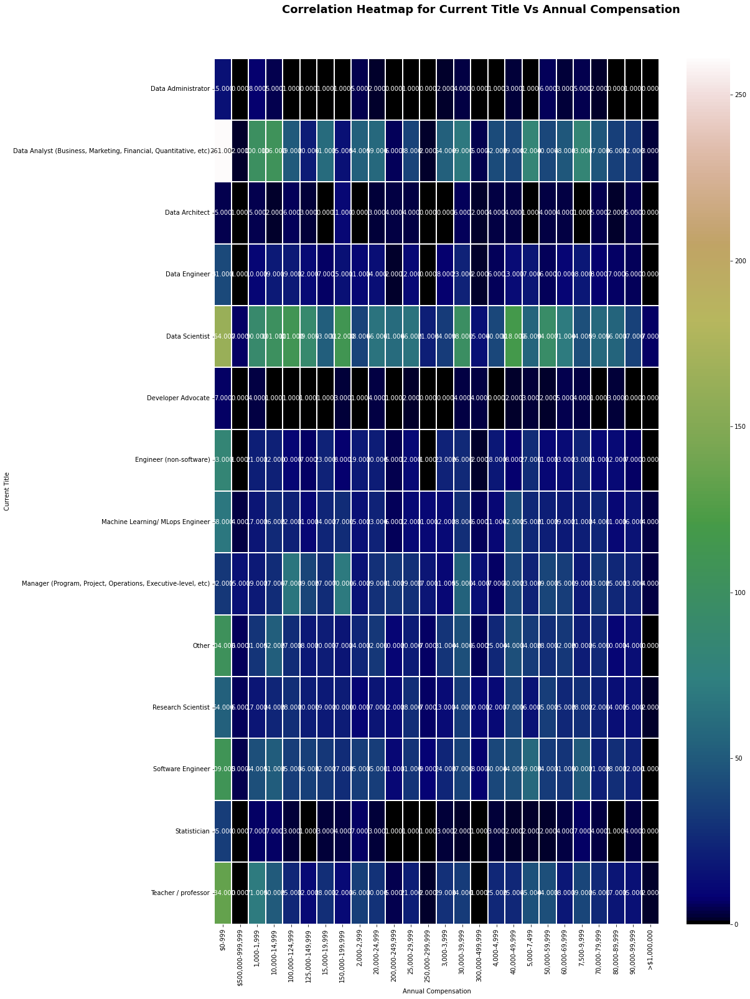

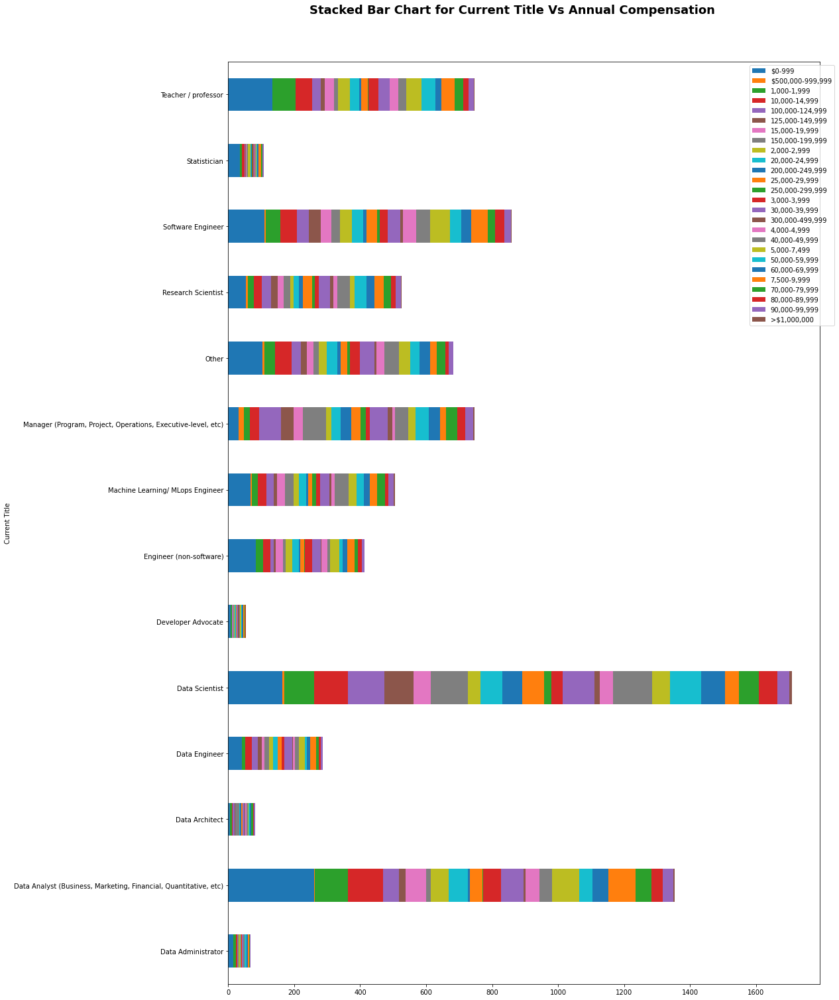

In [40]:
plot_heatmap(kaggle_2022, 'Current Title' , 'Annual Compensation')
plot_stackbar(kaggle_2022, 'Current Title' , 'Annual Compensation')

#  'Current Title' ==>  'Highest level of Education' ==> Plotting Heatmap and Correlation Bar Plot 📊

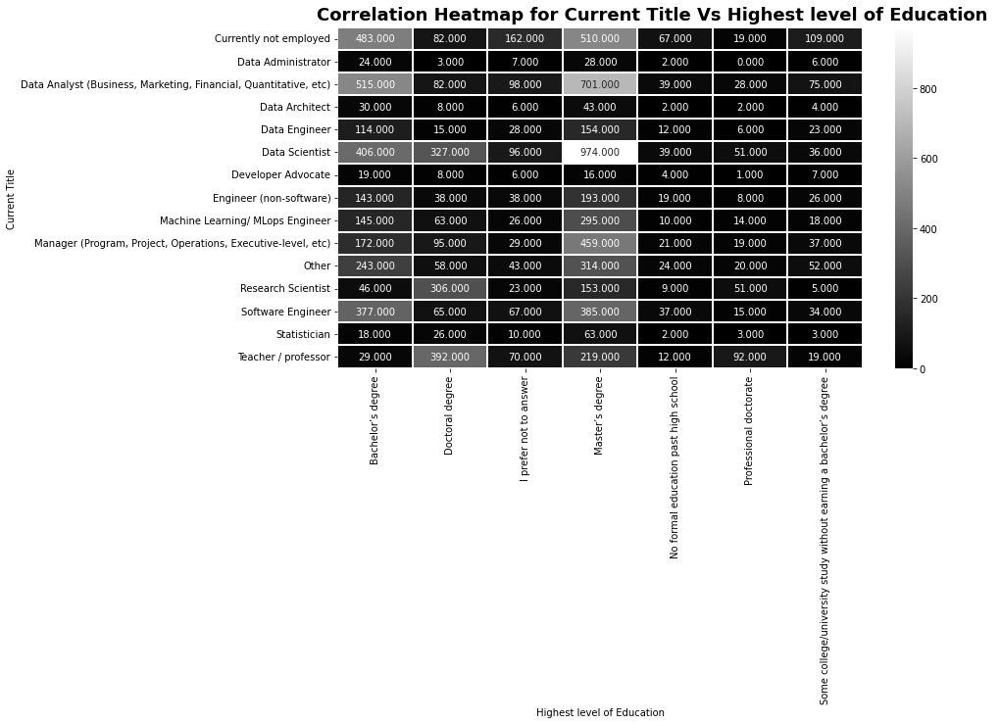

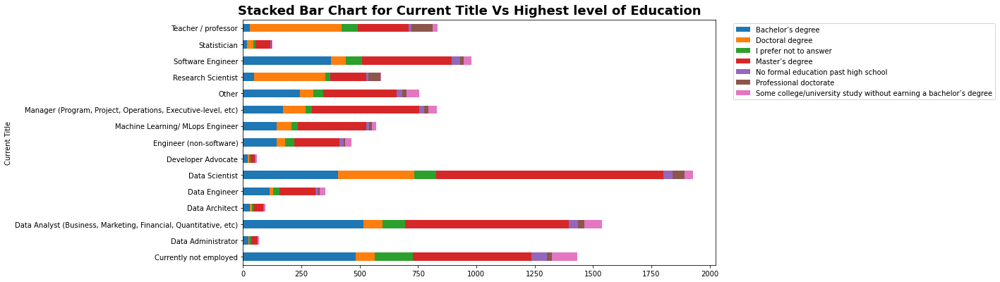

In [41]:
plot_heatmap(kaggle_2022, 'Current Title' , 'Highest level of Education')
plot_stackbar(kaggle_2022, 'Current Title' , 'Highest level of Education')

#  'Country' ==>  'Gender' ==> Plotting Heatmap and Correlation Bar Plot 📊

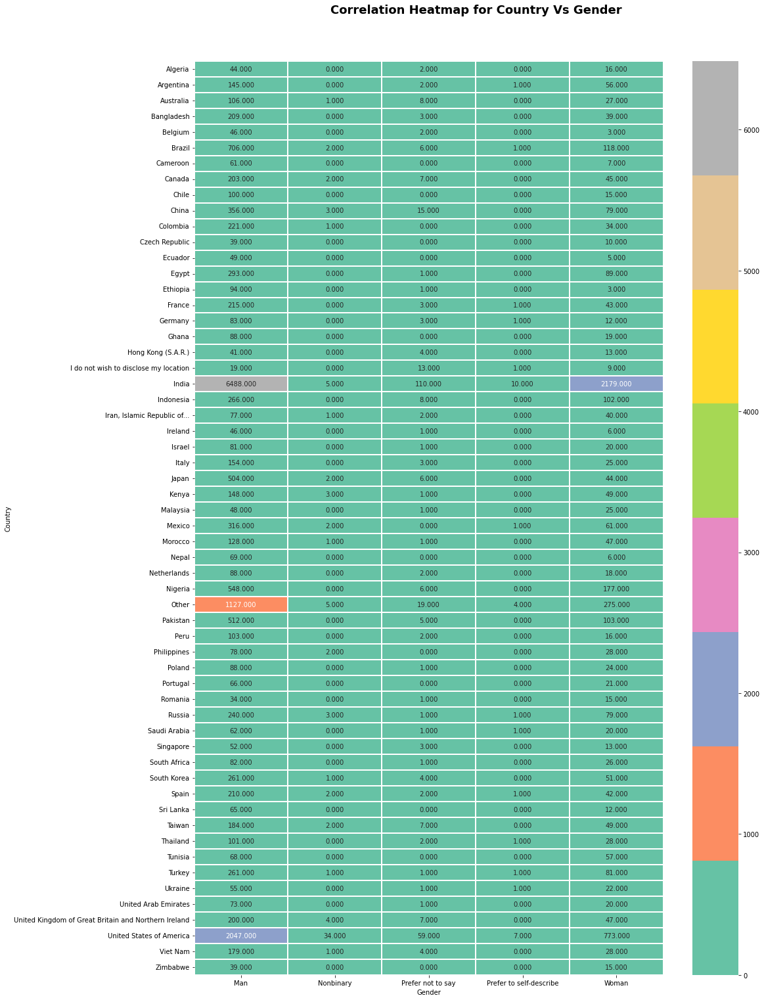

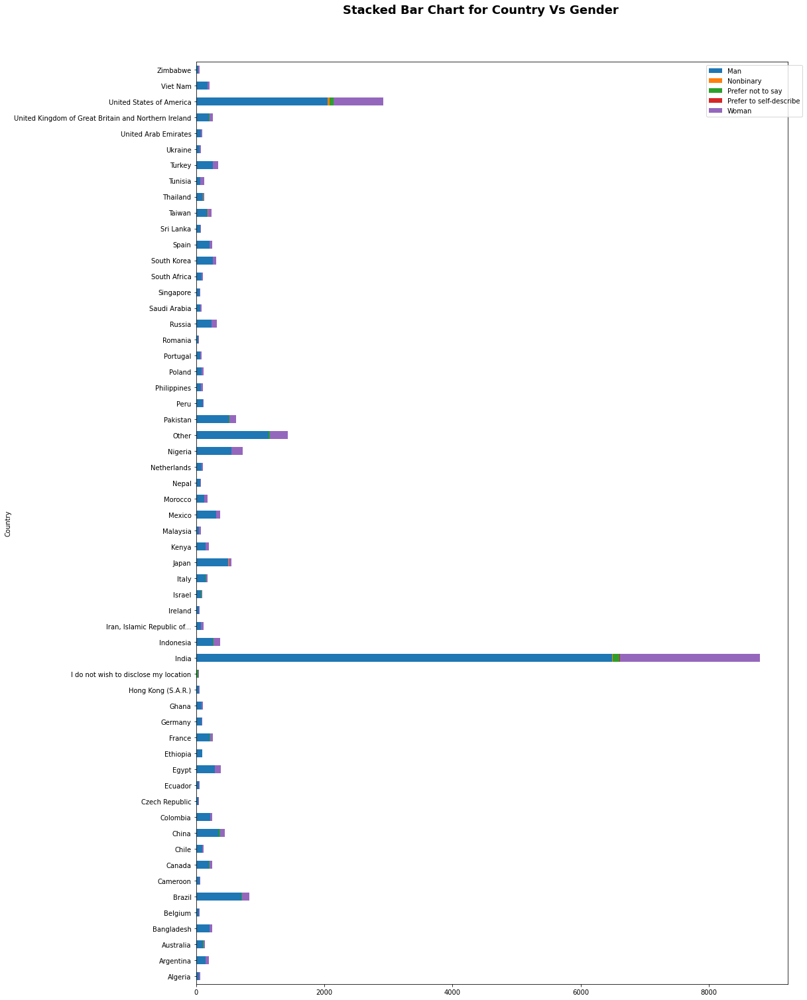

In [42]:

plot_heatmap(kaggle_2022, 'Country','Gender')
plot_stackbar(kaggle_2022, 'Country','Gender')

In [43]:
from random import randrange
import random

def rand_num():
    return(random.randint(0,255))

def rand_color():
    rand_color = (randrange(255), randrange(255), randrange(255))
    return rand_color

# Let us try a Sun Burst Chart

In [44]:


responsesOnly=kaggle_2022.fillna(0)

title = 'Mapping of ' + ' Country ' + ' Gender ' + 'Age Group ' + 'Highest level of Education ' + 'Industry '+  'Annual Compensation '+ 'Programming Experience ' + 'as a Sunburst Plot'
fig = px.sunburst(data_frame=responsesOnly,
                  path=['Country', 'Gender', 'Age Group','Highest level of Education','Industry', 'Annual Compensation','Programming Experience'],
                  color='Country',
                  color_discrete_sequence=px.colors.sequential.Viridis, 
                  title=title
                 )

fig.update_traces(textinfo='label+percent parent')
fig.update_layout(margin=dict(t=40, l=0, r=0, b=0))
fig.show()

# <strong>Work In PROGRESS</strong>